In [3]:
 import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns

# Understanding Business Objective

**Objective**

Lending Club is a consumer finance company which specialises in lending various types of loans to customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:

1. If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

2. If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company

Lending loans to ‘risky’ applicants causes credit loss which is the amount of money lost by the lender when the borrower refuses to pay or absconds with the money owed. These sort of customers labelled as 'charged-off' are the 'defaulters'.

The objective is to identify the driving factors behind loan default, the patterns indicating risky loan applicants, hence reducing the credit loss and saving the Lending Club from any financial setback.




# Loading Data

**Data Loading**

Loading the data which contains information about past loan applicants and whether they defaulted or not

In [4]:
df=pd.read_csv('loan.csv')
df.head(10)

<ipython-input-4-2061f37aa4b0>:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv('loan.csv')


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
5,1075269,1311441,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
6,1069639,1304742,7000,7000,7000.0,60 months,15.96%,170.08,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
7,1072053,1288686,3000,3000,3000.0,36 months,18.64%,109.43,E,E1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
8,1071795,1306957,5600,5600,5600.0,60 months,21.28%,152.39,F,F2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
9,1071570,1306721,5375,5375,5350.0,60 months,12.69%,121.45,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [5]:
df.shape

(39717, 111)

# Data Preparation

> handling missing values

> checking target column

> checking datatypes





In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Columns: 111 entries, id to total_il_high_credit_limit
dtypes: float64(74), int64(13), object(24)
memory usage: 33.6+ MB


Checking missing values

In [7]:
print(df.isnull().sum()/len(df)*100)

print(df.isna().mean() * 100)


id                              0.000000
member_id                       0.000000
loan_amnt                       0.000000
funded_amnt                     0.000000
funded_amnt_inv                 0.000000
                                 ...    
tax_liens                       0.098195
tot_hi_cred_lim               100.000000
total_bal_ex_mort             100.000000
total_bc_limit                100.000000
total_il_high_credit_limit    100.000000
Length: 111, dtype: float64
id                              0.000000
member_id                       0.000000
loan_amnt                       0.000000
funded_amnt                     0.000000
funded_amnt_inv                 0.000000
                                 ...    
tax_liens                       0.098195
tot_hi_cred_lim               100.000000
total_bal_ex_mort             100.000000
total_bc_limit                100.000000
total_il_high_credit_limit    100.000000
Length: 111, dtype: float64


Lets do a overkill and see describe

In [8]:
df.describe(include='all')

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
count,3.971700e+04,3.971700e+04,39717.000000,39717.000000,39717.000000,39717,39717,39717.000000,39717,39717,...,0.0,0.0,0.0,0.0,39020.000000,39678.0,0.0,0.0,0.0,0.0
unique,NaN,NaN,NaN,NaN,NaN,2,371,NaN,7,35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,36 months,10.99%,NaN,B,B3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,29096,956,NaN,12020,2917,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,6.831319e+05,8.504636e+05,11219.443815,10947.713196,10397.448868,NaN,NaN,324.561922,NaN,NaN,...,NaN,NaN,NaN,NaN,0.043260,0.0,NaN,NaN,NaN,NaN
std,2.106941e+05,2.656783e+05,7456.670694,7187.238670,7128.450439,NaN,NaN,208.874874,NaN,NaN,...,NaN,NaN,NaN,NaN,0.204324,0.0,NaN,NaN,NaN,NaN
min,5.473400e+04,7.069900e+04,500.000000,500.000000,0.000000,NaN,NaN,15.690000,NaN,NaN,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
25%,5.162210e+05,6.667800e+05,5500.000000,5400.000000,5000.000000,NaN,NaN,167.020000,NaN,NaN,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
50%,6.656650e+05,8.508120e+05,10000.000000,9600.000000,8975.000000,NaN,NaN,280.220000,NaN,NaN,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN
75%,8.377550e+05,1.047339e+06,15000.000000,15000.000000,14400.000000,NaN,NaN,430.780000,NaN,NaN,...,NaN,NaN,NaN,NaN,0.000000,0.0,NaN,NaN,NaN,NaN


In [9]:
null_pctg=df.isnull().sum()/len(df)*100
high_null_cols=null_pctg[null_pctg>40].index.tolist()
low_null_cols=null_pctg[null_pctg<=40].index.tolist()
print("Columns with null proportion > 40% : \n",high_null_cols)
print("Columns with null proportion <= 40% : \n",low_null_cols)

Columns with null proportion > 40% : 
 ['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_past_12m', 'pct_tl_nvr

Handle missing Values - null column analysis

In [10]:
null_pctg = df.isnull().sum() / len(df) * 100
null_pctg = null_pctg.sort_values(ascending=False)

print("Null percentages for each column:")
print(null_pctg)

print("\nColumns with null proportion > 40%:")
print(null_pctg[null_pctg > 40])

print("\nColumns with null proportion <= 40%:")
print(null_pctg[null_pctg <= 40])

Null percentages for each column:
verification_status_joint    100.0
annual_inc_joint             100.0
mo_sin_old_rev_tl_op         100.0
mo_sin_old_il_acct           100.0
bc_util                      100.0
                             ...  
delinq_amnt                    0.0
policy_code                    0.0
earliest_cr_line               0.0
delinq_2yrs                    0.0
id                             0.0
Length: 111, dtype: float64

Columns with null proportion > 40%:
verification_status_joint         100.000000
annual_inc_joint                  100.000000
mo_sin_old_rev_tl_op              100.000000
mo_sin_old_il_acct                100.000000
bc_util                           100.000000
bc_open_to_buy                    100.000000
avg_cur_bal                       100.000000
acc_open_past_24mths              100.000000
inq_last_12m                      100.000000
total_cu_tl                       100.000000
inq_fi                            100.000000
total_rev_hi_lim     

1. Columns with 100% Null Values
Action: Remove these columns

These columns provide no information and should be dropped.
Examples: verification_status_joint, annual_inc_joint, mo_sin_old_rev_tl_op, etc.

2. Columns with High Null Percentages (40% - 99%)
Action: Evaluate importance and consider removal or advanced imputation

next_pymnt_d (97.13% null): Likely safe to remove as it's future data
mths_since_last_record (92.99% null): Consider if this is a meaningful feature (absence might indicate no records)
mths_since_last_delinq (64.66% null): Similar to above, absence might be meaningful
Create a binary flag for missing/not missing
Impute with a special value (e.g., -1) to denote missing

3. Columns with Moderate Null Percentages (5% - 40%)
Action: Impute based on data type and distribution

desc (32.59% null): Text data, consider creating a 'missing_description' flag
emp_title (6.19% null): Categorical, impute with 'Unknown' or most frequent value

4. Columns with Low Null Percentages (< 5%)
Action: Impute using appropriate methods

emp_length (2.71% null): Ordinal, impute with median or mode
pub_rec_bankruptcies (1.75% null): Binary/Count, impute with 0 or mode
revol_util (0.13% null): Numerical, impute with median

5. Columns with No Null Values
Action: No imputation needed

These columns (e.g., loan_status, purpose, issue_d) are already complete and require no action for missing values.

Deleting coluns with more than 40% nulls; adding a duplicate dataframe to facilitate reversal

In [11]:
df_cleaned = df.drop(columns=high_null_cols)
print(f"Dropped {len(high_null_cols)} columns. New shape: {df_cleaned.shape}")
print("Dropped columns:", high_null_cols)
df = df_cleaned

Dropped 57 columns. New shape: (39717, 54)
Dropped columns: ['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d', 'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc', 'mths_since_recent_bc_dlq', 'mths_since_recent_inq', 'mths_since_recent_revol_delinq', 'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl', 'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0', 'num_sats', 'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m', 'num_tl_op_p

In [12]:
df_cleaned.shape

(39717, 54)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 54 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

Checking the target column 'loan_status'

In [14]:
df['loan_status'].value_counts()

,count
loan_status,
Fully Paid,32950
Charged Off,5627
Current,1140


Their are 3 types of status values. The ones with 'Current' status indicate the loan is still ongoing. Our focus will be only on 'Fully Paid' and 'Charged Off' to analyse the driving factors of loan default.

In [15]:
# dropping rows with loan_status 'Current'
df=df[df['loan_status']!='Current']
df.shape

(38577, 54)

Checking Datatypes - Checking Categorical columns

In [16]:
object_cols=df.select_dtypes(include=['object'])
object_cols.nunique()

,0
term,2
int_rate,370
grade,7
sub_grade,35
emp_title,28027
emp_length,11
home_ownership,5
verification_status,3
issue_d,55
loan_status,2


Checking if some columns like term, int_rate, emp_length marked as 'object' data type need to be converted to numerical data.

In [17]:
df['term'].head(10)

,term
0,36 months
1,60 months
2,36 months
3,36 months
5,36 months
6,60 months
7,36 months
8,60 months
9,60 months
10,60 months


In [18]:
df['term'].value_counts()

,count
term,
36 months,29096
60 months,9481


We see only 2 values are present for term indicating these are 2 predefined options offered by the Lending Club to borrowers. So we leave them as is.

In [19]:
df['int_rate'].head(10)

,int_rate
0,10.65%
1,15.27%
2,15.96%
3,13.49%
5,7.90%
6,15.96%
7,18.64%
8,21.28%
9,12.69%
10,14.65%


In [20]:
df['int_rate'].value_counts()

,count
int_rate,
10.99%,913
11.49%,790
7.51%,787
13.49%,749
7.88%,725
...,...
16.96%,1
18.36%,1
16.15%,1


In [21]:
# converting int_rate to float
df['int_rate']=df['int_rate'].str.rstrip('%').astype('float')
print(df['int_rate'].dtype)
print(df['int_rate'].head(10))

float64
0     10.65
1     15.27
2     15.96
3     13.49
5      7.90
6     15.96
7     18.64
8     21.28
9     12.69
10    14.65
Name: int_rate, dtype: float64


<ipython-input-21-0325523a557f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['int_rate']=df['int_rate'].str.rstrip('%').astype('float')


In [22]:
df['revol_util'].head(10)

,revol_util
0,83.70%
1,9.40%
2,98.50%
3,21%
5,28.30%
6,85.60%
7,87.50%
8,32.60%
9,36.50%
10,20.60%


In [23]:
# converting revol_util to float
df['revol_util']=df['revol_util'].str.rstrip('%').astype(float)
print(df['revol_util'].dtype)
print(df['revol_util'].head(10))

float64
0     83.7
1      9.4
2     98.5
3     21.0
5     28.3
6     85.6
7     87.5
8     32.6
9     36.5
10    20.6
Name: revol_util, dtype: float64


<ipython-input-23-32acfdca7c46>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['revol_util']=df['revol_util'].str.rstrip('%').astype(float)


In [24]:
df['emp_length'].head(10)

,emp_length
0,10+ years
1,< 1 year
2,10+ years
3,10+ years
5,3 years
6,8 years
7,9 years
8,4 years
9,< 1 year
10,5 years


In [25]:
df['emp_length'].value_counts()

,count
emp_length,
10+ years,8488
< 1 year,4508
2 years,4291
3 years,4012
4 years,3342
5 years,3194
1 year,3169
6 years,2168
7 years,1711


Employee experience is showing discrete integers, but generally employee experience can be any numerical value. Converting emp_length to float.

In [26]:
# converting emp_length to float
df['emp_length']=df['emp_length'].str.replace('years','')
df['emp_length']=df['emp_length'].str.replace('year','')
df['emp_length']=df['emp_length'].str.replace('+','')
df['emp_length']=df['emp_length'].str.replace('< 1','0.5')
df['emp_length']=df['emp_length'].astype('float')
print(df['emp_length'].dtype)
print(df['emp_length'].value_counts)

float64
<bound method IndexOpsMixin.value_counts of 0        10.0
1         0.5
2        10.0
3        10.0
5         3.0
         ... 
39712     4.0
39713     3.0
39714     0.5
39715     0.5
39716     0.5
Name: emp_length, Length: 38577, dtype: float64>


<ipython-input-26-fa9df5bd7ab2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['emp_length']=df['emp_length'].str.replace('years','')
<ipython-input-26-fa9df5bd7ab2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['emp_length']=df['emp_length'].str.replace('year','')
<ipython-input-26-fa9df5bd7ab2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://panda

In [27]:
df['emp_length'].head(15)

,emp_length
0,10.0
1,0.5
2,10.0
3,10.0
5,3.0
6,8.0
7,9.0
8,4.0
9,0.5
10,5.0


There are some columns which have only 1 unique value. There are not suitable for analysis.

In [28]:
# columns which have 1 unique value
cols_uniq1=df.columns[df.nunique()==1]
cols_uniq1

Index(['pymnt_plan', 'initial_list_status', 'out_prncp', 'out_prncp_inv',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'tax_liens'],
      dtype='object')

In [29]:
for col in ['pymnt_plan', 'initial_list_status', 'collections_12_mths_ex_med',
       'policy_code', 'application_type', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens']:
  print("column:",col)
  print(df[col].head())
  print('-'*50)

column: pymnt_plan
0    n
1    n
2    n
3    n
5    n
Name: pymnt_plan, dtype: object
--------------------------------------------------
column: initial_list_status
0    f
1    f
2    f
3    f
5    f
Name: initial_list_status, dtype: object
--------------------------------------------------
column: collections_12_mths_ex_med
0    0.0
1    0.0
2    0.0
3    0.0
5    0.0
Name: collections_12_mths_ex_med, dtype: float64
--------------------------------------------------
column: policy_code
0    1
1    1
2    1
3    1
5    1
Name: policy_code, dtype: int64
--------------------------------------------------
column: application_type
0    INDIVIDUAL
1    INDIVIDUAL
2    INDIVIDUAL
3    INDIVIDUAL
5    INDIVIDUAL
Name: application_type, dtype: object
--------------------------------------------------
column: acc_now_delinq
0    0
1    0
2    0
3    0
5    0
Name: acc_now_delinq, dtype: int64
--------------------------------------------------
column: chargeoff_within_12_mths
0    0.0
1    0.0
2

In [30]:
# dropping the columns having 1 unique value
df.drop(columns=cols_uniq1,inplace=True)
df.shape

<ipython-input-30-aca3abf0d9c7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=cols_uniq1,inplace=True)


(38577, 43)

Checking columns 'url','desc','purpose','title','zip_code','addr_state','title','id','member_id'

In [31]:
 for col in ['url','desc','purpose','title','zip_code','addr_state','id','member_id']:
  print("column:",col)
  print(df[col].head(10))
  print('-'*50)

column: url
0     https://lendingclub.com/browse/loanDetail.acti...
1     https://lendingclub.com/browse/loanDetail.acti...
2     https://lendingclub.com/browse/loanDetail.acti...
3     https://lendingclub.com/browse/loanDetail.acti...
5     https://lendingclub.com/browse/loanDetail.acti...
6     https://lendingclub.com/browse/loanDetail.acti...
7     https://lendingclub.com/browse/loanDetail.acti...
8     https://lendingclub.com/browse/loanDetail.acti...
9     https://lendingclub.com/browse/loanDetail.acti...
10    https://lendingclub.com/browse/loanDetail.acti...
Name: url, dtype: object
--------------------------------------------------
column: desc
0       Borrower added on 12/22/11 > I need to upgra...
1       Borrower added on 12/22/11 > I plan to use t...
2                                                   NaN
3       Borrower added on 12/21/11 > to pay for prop...
5                                                   NaN
6       Borrower added on 12/18/11 > I am planning o...
7  

In [32]:
print('Unique value counts of below columns-')
for col in ['title','purpose','desc','addr_state']:
  print(col,' -- ',df[col].nunique())


Unique value counts of below columns-
title  --  19297
purpose  --  14
desc  --  25802
addr_state  --  50


In [33]:
for col in ['purpose','addr_state']:
  print(df[col].value_counts())
  print('--'*50)


purpose
debt_consolidation    18055
credit_card            5027
other                  3865
home_improvement       2875
major_purchase         2150
small_business         1754
car                    1499
wedding                 926
medical                 681
moving                  576
vacation                375
house                   367
educational             325
renewable_energy        102
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
addr_state
CA    6949
NY    3698
FL    2781
TX    2659
NJ    1790
IL    1478
PA    1468
VA    1369
GA    1359
MA    1297
OH    1178
MD    1023
AZ     849
WA     818
CO     766
NC     750
CT     726
MI     704
MO     670
MN     605
NV     479
SC     459
WI     440
AL     435
OR     435
LA     427
KY     311
OK     287
KS     255
UT     252
AR     235
DC     211
RI     194
NM     183
WV     172
NH     166
HI     166
DE     113
MT      83
WY      80
AK      78
SD      62


Columns like url, id, member_id, do not carry much insightful information to help in analysis.

Also, since we have addr_state which is the state provided by borrower, we do not need zip codes. addr_state indicates the place of the borrower.

Columns like title and desc are most probably handwritten by the borrowers while filling up the loan application, so it is much varied. The purpose column is a much better and compact summary having 14 unique categories into which the reason for taking loan can be mapped may be because the options were selected from dropdown list. So we can drop title and desc and keep purpose.

In [34]:
# dropping columns not having significance in analysis
df.drop(columns=['url','desc','zip_code','title','id','member_id'],inplace=True)
df.shape

<ipython-input-34-578741ff4dc1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['url','desc','zip_code','title','id','member_id'],inplace=True)


(38577, 37)

Now that redundant columsns are removed and the right data types are assigned to the right columns, we can seggregate columns as numerical and categorical based on data types and then proceed to impute missing values accordingly.

In [35]:
numcols=[]
catcols=[]
for col in df.columns:
  #print(col,"-->",df[col].dtype)
  if df[col].dtype=='object':
    catcols.append(col)
  elif df[col].dtype in ['int64','float64']:
    numcols.append(col)
print("categorical columns :",catcols)
print("numerical columns :",numcols)

categorical columns : ['term', 'grade', 'sub_grade', 'emp_title', 'home_ownership', 'verification_status', 'issue_d', 'loan_status', 'purpose', 'addr_state', 'earliest_cr_line', 'last_pymnt_d', 'last_credit_pull_d']
numerical columns : ['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'int_rate', 'installment', 'emp_length', 'annual_inc', 'dti', 'delinq_2yrs', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt', 'pub_rec_bankruptcies']


checking null values in categorical columns

In [36]:
# checking null values in categorical columns

for col in catcols:
  print(col,"--->  ",df[col].isnull().sum()/len(df)*100,"%")

term --->   0.0 %
grade --->   0.0 %
sub_grade --->   0.0 %
emp_title --->   6.185032532337922 %
home_ownership --->   0.0 %
verification_status --->   0.0 %
issue_d --->   0.0 %
loan_status --->   0.0 %
purpose --->   0.0 %
addr_state --->   0.0 %
earliest_cr_line --->   0.0 %
last_pymnt_d --->   0.184047489436711 %
last_credit_pull_d --->   0.005184436322160873 %


Checking emp_title column

In [37]:
emptitles=df['emp_title'].value_counts()
print(emptitles)

emp_title
US Army                                     131
Bank of America                             107
IBM                                          65
AT&T                                         57
Kaiser Permanente                            56
                                           ... 
amneal pharmaceuticals                        1
Net Equity Financial                          1
Kernersville Fire Department                  1
The Keith Corp. (empl by county, now Kei      1
Evergreen Center                              1
Name: count, Length: 28027, dtype: int64


In [38]:
low_freq_emptitles=emptitles[emptitles<20]
print("Proportion of emp_titles below frequency 20 is",round(len(low_freq_emptitles)/len(emptitles)*100,2),"%.")
print(low_freq_emptitles)

Proportion of emp_titles below frequency 20 is 99.81 %.
emp_title
General Dynamics                            18
US Government                               18
usps                                        18
Internal Revenue Service                    18
SAIC                                        18
                                            ..
amneal pharmaceuticals                       1
Net Equity Financial                         1
Kernersville Fire Department                 1
The Keith Corp. (empl by county, now Kei     1
Evergreen Center                             1
Name: count, Length: 27973, dtype: int64


In [39]:
low_freq_emptitles=emptitles[emptitles<50]
print("Proportion of emp_titles below frequency 50 is",round(len(low_freq_emptitles)/len(emptitles)*100,2),"%.")
print(low_freq_emptitles)

Proportion of emp_titles below frequency 50 is 99.97 %.
emp_title
Walmart                                     45
United States Air Force                     42
Lockheed Martin                             42
Self Employed                               40
U.S. Army                                   40
                                            ..
amneal pharmaceuticals                       1
Net Equity Financial                         1
Kernersville Fire Department                 1
The Keith Corp. (empl by county, now Kei     1
Evergreen Center                             1
Name: count, Length: 28018, dtype: int64


In [40]:
high_freq_emptitles=emptitles[emptitles>=50]
print("Proportion of emp_titles >=50 is",round(len(high_freq_emptitles)/len(emptitles)*100,2),"%.")
print(high_freq_emptitles)

Proportion of emp_titles >=50 is 0.03 %.
emp_title
US Army              131
Bank of America      107
IBM                   65
AT&T                  57
Kaiser Permanente     56
USAF                  52
Wells Fargo           52
UPS                   52
US Air Force          51
Name: count, dtype: int64


Since barplots of emp_title vs frequency getting over-cluttered due to presence of numerous categories, we will try to visualize the box plot of the frequencies of the emp_title column

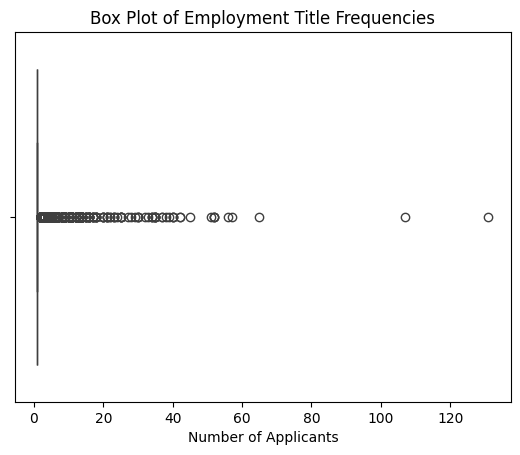

In [41]:
# Box plot of frequencies
sns.boxplot(x=emptitles)
plt.title('Box Plot of Employment Title Frequencies')
plt.xlabel('Number of Applicants')


plt.show()

In [42]:
emptitles.describe()

,count
count,28027.000000
mean,1.291291
std,2.027111
min,1.000000
25%,1.000000
50%,1.000000
75%,1.000000
max,131.000000


There is a high imbalance and diversity in frequency of the employee titles.

To avoid biasness, discrimination and partiality towards a certain profession of people while providing loans, we will fill the missing values with 'unknown' tag and not mode.

In [43]:
df['emp_title']=df['emp_title'].fillna('Unknown')

<ipython-input-43-5b12bdb9787c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['emp_title']=df['emp_title'].fillna('Unknown')


Since presence of numerous emptitle categories is cluttering the visuals and hindering analysis, we will club up the less frequent emptitles (frequency<20) in 'Other' category in later steps when we do the analysis.

Checking missing values of column last_payment_d

In [44]:
blank_last_paydates=df[df['last_pymnt_d'].isnull()]
print(len(blank_last_paydates))

71


In [45]:
blank_last_paydates['loan_status'].value_counts()

,count
loan_status,
Charged Off,71


The missing values of last_pymnt_d indicate that all the borrowers who have last_payment_d missing in their records were charged off. So we will impute missing values with value 'Not paid'

In [46]:
# imputing last_pymnt_d with 'Not paid'
df['last_pymnt_d']=df['last_pymnt_d'].fillna('Not paid')

<ipython-input-46-138fe084afdc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['last_pymnt_d']=df['last_pymnt_d'].fillna('Not paid')


In [47]:
# imputing last_credit_pull_d with mode
df['last_credit_pull_d']=df['last_credit_pull_d'].fillna(df['last_credit_pull_d'].mode()[0])

<ipython-input-47-3bbfbb0aaeb7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['last_credit_pull_d']=df['last_credit_pull_d'].fillna(df['last_credit_pull_d'].mode()[0])


In [48]:
for col in catcols:
  print(col,"--->  ",df[col].isnull().sum()/len(df)*100,"%")

term --->   0.0 %
grade --->   0.0 %
sub_grade --->   0.0 %
emp_title --->   0.0 %
home_ownership --->   0.0 %
verification_status --->   0.0 %
issue_d --->   0.0 %
loan_status --->   0.0 %
purpose --->   0.0 %
addr_state --->   0.0 %
earliest_cr_line --->   0.0 %
last_pymnt_d --->   0.0 %
last_credit_pull_d --->   0.0 %


checking nulls in numerical columns

In [49]:
for col in numcols:
  print(col,"--->  ",df[col].isnull().sum()/len(df)*100,"%")

loan_amnt --->   0.0 %
funded_amnt --->   0.0 %
funded_amnt_inv --->   0.0 %
int_rate --->   0.0 %
installment --->   0.0 %
emp_length --->   2.6777613603960906 %
annual_inc --->   0.0 %
dti --->   0.0 %
delinq_2yrs --->   0.0 %
inq_last_6mths --->   0.0 %
open_acc --->   0.0 %
pub_rec --->   0.0 %
revol_bal --->   0.0 %
revol_util --->   0.12961090805402184 %
total_acc --->   0.0 %
total_pymnt --->   0.0 %
total_pymnt_inv --->   0.0 %
total_rec_prncp --->   0.0 %
total_rec_int --->   0.0 %
total_rec_late_fee --->   0.0 %
recoveries --->   0.0 %
collection_recovery_fee --->   0.0 %
last_pymnt_amnt --->   0.0 %
pub_rec_bankruptcies --->   1.8067760582730643 %


checking missing values of column pub_rec_bankruptcies

In [50]:
blank_bankrupts=df[df['pub_rec_bankruptcies'].isnull()]
print(len(blank_bankrupts))
print(blank_bankrupts['loan_status'].value_counts())

697
loan_status
Fully Paid     579
Charged Off    118
Name: count, dtype: int64


In [51]:
df['pub_rec_bankruptcies'].value_counts()

,count
pub_rec_bankruptcies,
0.0,36238
1.0,1637
2.0,5


Null values of pub_rec_bankruptcies simply mean person was not bankrupted. So imputing with 0

In [52]:
df['pub_rec_bankruptcies']=df['pub_rec_bankruptcies'].fillna(0)

<ipython-input-52-262bca691765>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['pub_rec_bankruptcies']=df['pub_rec_bankruptcies'].fillna(0)


In [53]:
# imputing columns 'emp_length', 'revol_util' with median
for col in ['emp_length','revol_util']:
  df[col]=df[col].fillna(df[col].median())

<ipython-input-53-d7ba32d651ec>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col]=df[col].fillna(df[col].median())


In [54]:
# checking null values in categorical columns

for col in numcols:
  print(col,"--->  ",df[col].isnull().sum()/len(df)*100,"%")

loan_amnt --->   0.0 %
funded_amnt --->   0.0 %
funded_amnt_inv --->   0.0 %
int_rate --->   0.0 %
installment --->   0.0 %
emp_length --->   0.0 %
annual_inc --->   0.0 %
dti --->   0.0 %
delinq_2yrs --->   0.0 %
inq_last_6mths --->   0.0 %
open_acc --->   0.0 %
pub_rec --->   0.0 %
revol_bal --->   0.0 %
revol_util --->   0.0 %
total_acc --->   0.0 %
total_pymnt --->   0.0 %
total_pymnt_inv --->   0.0 %
total_rec_prncp --->   0.0 %
total_rec_int --->   0.0 %
total_rec_late_fee --->   0.0 %
recoveries --->   0.0 %
collection_recovery_fee --->   0.0 %
last_pymnt_amnt --->   0.0 %
pub_rec_bankruptcies --->   0.0 %


Sanity test on the date columns

In [55]:
for col in ['earliest_cr_line', 'issue_d','last_credit_pull_d']:
  print(col)
  dates = pd.to_datetime(df[col], format='%b-%y')
  lowest_date = dates.min()
  highest_date = dates.max()

  # Count values with years greater than 2024
  count_future_years = (dates.dt.year > 2024).sum()

  print(f"Column: {col}")
  print(f"  Lowest Date: {lowest_date}")
  print(f"  Highest Date: {highest_date}")
  print(f"  Count of dates with year greater than 2024: {count_future_years}")
  print('--'*50)


earliest_cr_line
Column: earliest_cr_line
  Lowest Date: 1969-02-01 00:00:00
  Highest Date: 2068-12-01 00:00:00
  Count of dates with year greater than 2024: 85
----------------------------------------------------------------------------------------------------
issue_d
Column: issue_d
  Lowest Date: 2007-06-01 00:00:00
  Highest Date: 2011-12-01 00:00:00
  Count of dates with year greater than 2024: 0
----------------------------------------------------------------------------------------------------
last_credit_pull_d
Column: last_credit_pull_d
  Lowest Date: 2007-05-01 00:00:00
  Highest Date: 2016-05-01 00:00:00
  Count of dates with year greater than 2024: 0
----------------------------------------------------------------------------------------------------


In [56]:
df['issue_dd'] = pd.to_datetime(df['issue_d'], format='%b-%y')

def adjust_earliest_cr_line(row):
    month, year = row['earliest_cr_line'].split('-')
    year = int(year)

    # Initialize the adjusted year
    adjusted_year = None

    # Check the year and adjust accordingly
    if year > 11:
        adjusted_year = year + 1900  # Add 1900 for years greater than 11
    else:
        adjusted_year = year + 2000  # Add 2000 for years less than or equal to 11

        # Create a temporary date for comparison
        temp_date = pd.to_datetime(f"{month}-{adjusted_year}", format='%b-%Y', errors='coerce')

        # Compare with issue_d
        if temp_date > row['issue_dd']:
            adjusted_year = year + 1900  # Adjust to 1900s if it exceeds issue_d

    return f"{month}-{adjusted_year}"

# Apply the function to create a new adjusted column
df['earliest_cr_line'] = df.apply(adjust_earliest_cr_line, axis=1)

# Convert to datetime
#df['adjusted_earliest_cr_line'] = pd.to_datetime(df['adjusted_earliest_cr_line'], format='%b-%Y', errors='coerce')

print(df.loc[[1576, 1764, 3274, 3349], ['earliest_cr_line','issue_d']])

<ipython-input-56-c37e2f33778b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['issue_dd'] = pd.to_datetime(df['issue_d'], format='%b-%y')


     earliest_cr_line issue_d
1576         Sep-1962  Dec-11
1764         Sep-1968  Dec-11
3274         Sep-1967  Nov-11
3349         Feb-1965  Nov-11


<ipython-input-56-c37e2f33778b>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['earliest_cr_line'] = df.apply(adjust_earliest_cr_line, axis=1)


# Dervived Columns

Purpose: To assign a credit score to applicants

Determining credit history length of applicants

In [57]:
df['earliest_cr_line'] = pd.to_datetime(df['earliest_cr_line'], format='%b-%Y')

# Calculate credit history length in years
df['credit_history_length'] = (pd.to_datetime('today') - df['earliest_cr_line']).dt.days / 365.25

<ipython-input-57-62fcdaa32c75>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['earliest_cr_line'] = pd.to_datetime(df['earliest_cr_line'], format='%b-%Y')
<ipython-input-57-62fcdaa32c75>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['credit_history_length'] = (pd.to_datetime('today') - df['earliest_cr_line']).dt.days / 365.25


In [58]:
len(df[df['credit_history_length']<0])

0

**Calculating credit score:**

**Weightage on the criterion:**

Payment history: 35%

Credit utilization: 30%

Length of credit history: 15%

Credit mix: 10%

**Columns considered for each criterion:**

Payment history: 'delinq_2yrs', 'pub_rec_bankruptcies', 'total_rec_late_fee', 'collection_recovery_fee'

Credit utilization: 'revol_util'

Length of credit history: 'credit_history_length'

Credit mix: 'total_acc'

In [59]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# Normalize the relevant columns and create new ones
df[['delinq_2yrs_norm', 'pub_rec_bankruptcies_norm', 'total_rec_late_fee_norm',
    'collection_recovery_fee_norm', 'revol_util_norm', 'credit_history_length_norm',
    'total_acc_norm']] = scaler.fit_transform(
    df[['delinq_2yrs', 'pub_rec_bankruptcies', 'total_rec_late_fee', 'collection_recovery_fee',
        'revol_util', 'credit_history_length', 'total_acc']]
)

# Calculate the credit score using the normalized columns
df['credit_score'] = (
    (1 - df['delinq_2yrs_norm']) * 0.35 +    # Invert since lower is better
    (1 - df['pub_rec_bankruptcies_norm']) * 0.35 +  # Invert
    (1 - df['total_rec_late_fee_norm']) * 0.35 +  # Invert
    (1 - df['collection_recovery_fee_norm']) * 0.35 +  # Invert
    (1 - df['revol_util_norm']) * 0.30 +      # Invert since lower is better
    (df['credit_history_length_norm'] * 0.15) +  # Keep as is
    (df['total_acc_norm'] * 0.10)              # Keep as is
)

# Drop the normalization columns
df.drop(columns=['delinq_2yrs_norm', 'pub_rec_bankruptcies_norm',
                 'total_rec_late_fee_norm', 'collection_recovery_fee_norm',
                 'revol_util_norm', 'credit_history_length_norm',
                 'total_acc_norm'], inplace=True)

# Normalize the total score to fall within [0, 1]
df['credit_score'] = df['credit_score'] / df['credit_score'].max()
print(df[['credit_score']].head(10))


    credit_score
0       0.815602
1       0.914423
2       0.770610
3       0.902195
5       0.881578
6       0.787386
7       0.778091
8       0.875929
9       0.862943
10      0.909566


<ipython-input-59-570d11988951>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['delinq_2yrs_norm', 'pub_rec_bankruptcies_norm', 'total_rec_late_fee_norm',
<ipython-input-59-570d11988951>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['delinq_2yrs_norm', 'pub_rec_bankruptcies_norm', 'total_rec_late_fee_norm',
<ipython-input-59-570d11988951>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See th

In [60]:
numcols.extend(['credit_score','credit_history_length'])

# Univariate Analysis of Numerical Columns

**Purpose** - To understand the nature of distributions of the columns, to know the overall nature of the daatset.

In [61]:
plt.style.use('default')

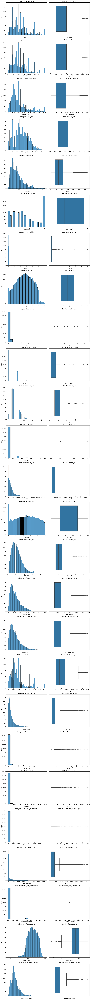

In [62]:

num_cols = len(numcols)
fig, axes = plt.subplots(num_cols, 2, figsize=(12, 5 * num_cols))


for i, col in enumerate(numcols):

    # Histogram
    sns.histplot(data=df, x=col, ax=axes[i, 0])
    axes[i, 0].set_title(f'Histogram of {col}')

    # Box plot
    sns.boxplot(data=df, x=col, ax=axes[i, 1])
    axes[i, 1].set_title(f'Box Plot of {col}')




# Adjust layout
plt.tight_layout()
plt.show()


In [63]:
df.describe()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,earliest_cr_line,...,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,pub_rec_bankruptcies,issue_dd,credit_history_length,credit_score
count,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,3.857700e+04,38577.000000,38577.000000,38577,...,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577.000000,38577,38577.000000,38577.000000
mean,11047.025430,10784.058506,10222.481123,11.932219,322.466318,4.974207,6.877797e+04,13.272727,0.146668,1997-02-04 00:26:25.690955776,...,9648.322898,2119.243370,1.368634,98.035545,12.772728,2746.243218,0.042694,2010-10-25 23:47:14.030640128,27.709738,0.856355
min,500.000000,500.000000,0.000000,5.420000,15.690000,0.500000,4.000000e+03,0.000000,0.000000,1946-01-01 00:00:00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007-06-01 00:00:00,15.969884,0.571473
25%,5300.000000,5200.000000,5000.000000,8.940000,165.740000,2.000000,4.000000e+04,8.130000,0.000000,1993-12-01 00:00:00,...,4500.000000,643.990000,0.000000,0.000000,0.000000,217.420000,0.000000,2010-05-01 00:00:00,23.137577,0.816628
50%,9600.000000,9550.000000,8733.440000,11.710000,277.860000,4.000000,5.886800e+04,13.370000,0.000000,1998-05-01 00:00:00,...,8000.000000,1300.450000,0.000000,0.000000,0.000000,568.260000,0.000000,2011-01-01 00:00:00,26.475017,0.857224
75%,15000.000000,15000.000000,14000.000000,14.380000,425.550000,9.000000,8.200000e+04,18.560000,0.000000,2001-09-01 00:00:00,...,13175.000000,2671.980000,0.000000,0.000000,0.000000,3447.250000,0.000000,2011-08-01 00:00:00,30.888433,0.898813
max,35000.000000,35000.000000,35000.000000,24.400000,1305.190000,10.000000,6.000000e+06,29.990000,11.000000,2008-11-01 00:00:00,...,35000.020000,23563.680000,180.200000,29623.350000,7002.190000,36115.200000,2.000000,2011-12-01 00:00:00,78.803559,1.000000
std,7348.441646,7090.306027,7022.720644,3.691327,208.639215,3.433428,6.421868e+04,6.673044,0.492271,NaN,...,7009.381200,2389.499511,7.315880,698.650182,150.836853,4494.648131,0.202809,NaN,6.822326,0.054439


In [64]:
df['revol_util'].describe()

,revol_util
count,38577.000000
mean,48.703292
std,28.346356
min,0.000000
25%,25.200000
50%,49.100000
75%,72.200000
max,99.900000


Key Insights:


1. Columns loan_amt, funded_amnt, funded_amnt_inv are right skewed. Outliers indicate that seldom, applicants request exorbitant loans crossing the highest value in the range (as per uppermost whisker of the box plot) at \$30,000.

  Median of loan amount demanded by borrowers= \$9600

  Median of loan amount funded= \$9550

  Median of loan amount funded by investors= \$8733

  The funded amounts are never higher than the loan amount. Also, not all loans are funded by investors as per the minimum value of funded_amnt_inv.

  Out of the 3, we can consider that funded_amnt and funded_amnt_inv depends on loan_amnt.


2. Median interest rate is 11.7% , 75% of values are under 14.38% although as per outliers, sometimes there are extremely high interest rates crossing 22%.


3. Installments owed by borrowers have median value of \$277.86 but many outliers are present beyond $800.


4. Column emp_length have median at 4 years and maximum is at 10 years. Although there are many senior applicants requesting loans, more applicants are mainly in the junior or mid level of employment experience.


5. Column annual_inc is hard to interpret, so we will bucket the values for better understanding in subsequent steps.


6. Column dti ( ratio calculated using the borrower’s total monthly debt payments on the total debt obligations) follows nearly normal distribution. Median is near 13.3 and values at 75th percentile is about 18.5.


7. Column delinq_2yrs have peak near 0 and a few outliers indicating those who have 30+ days past-due incidences of delinquency for past 2 years. Majority do not have any such case.


8. Column inq_last_6_mnth imply that not many inquiries are made over last 6 months.


9. Column open_acc which denotes number of open credit lines of a borrower, is right skewed having median near 10 with few outliers.


10. Column pub_rec indicates almost all people have clean public records but very few outlier people have derogatory public records.


11. Columns revol_balance denote the balance the borrowers owe on the credit accounts and revol_util denote the ratio of the credit used by the borrower relative to the overall available credit. Though borrowers use the credits judiciously, there are many outliers in box plot of revol_balance indicating that many borrowers are using the credits a lot and owing high balance. This has also pushed up the median of revol_util to nearly 50%. This needs to be treated with caution.



12. Columns total_acc (total number of credit files in a borrower's file), total_pymnt, total_pymnt_inv, total_rec_int, total_rec_prncp (the payments recieved from the borrowers) have outliers indicating that people are highly reliant on the Lending Club and heavily using their loan provision services. But outliers in total_pymnt_late_fee column indicate that many people were fined for paying late.


13. Columns recoveries and collection_recovery_fee have outliers indicating that many borrowers charged off due to which they were handed over to collection agencies for recovering the amount and very high recovery fees were collected from them


14. Column last_pymnt_amnt has outliers implying high amounts paid by borrowers.


15. Column pub_rec_bankruptcies have majority 0 values indicating majority people have no such record of bankruptcy.


16. credit_score is left skewed showing outliers having too less credit scores. This needs to be treated with caution.


17. credit_histrory_length is right skewed showing outliers having too long credit history lengths.


# Univariate Analysis of Categorical Columns

**Purpose** - To understand the nature and frequency of values in the columns, to know the overall nature of the dataset.

As decided earlier, we have to segment annual_inc into some categories for better visualization. Furhermore, lets also segment the other continuous numerical values like loan_amnt, int_rate

In [65]:
# need to segment annual income and then plot graphs
# df['annual_inc_category']=pd.qcut(df['annual_inc'],q=5,labels=['VL', 'L', 'M', 'H', 'VH'])
quantiles = [0, 0.2, 0.4, 0.6, 0.8, 1.0]
labels = ['VL', 'L', 'M', 'H', 'VH']
bucket_ranges = {}
columns_to_categorize = ['annual_inc', 'loan_amnt', 'int_rate']
for col in columns_to_categorize:
    col2=col+"_category"
    df[col2] = pd.qcut(df[col], q=quantiles, labels=labels)
    bin_edges = pd.qcut(df[col], q=quantiles, retbins=True)[1]
    # Create a dictionary to hold the ranges for each bucket
    bucket_ranges = {}

    # Create ranges for each bucket
    for i in range(len(bin_edges) - 1):
        bucket_ranges[labels[i]] = (bin_edges[i], bin_edges[i + 1])

    # Display the ranges for each bucket
    print("column:",col2)
    for label, range_ in bucket_ranges.items():
        print(f'Range for {label}: {range_[0]:.2f} to {range_[1]:.2f}')
    print("--"*50)

column: annual_inc_category
Range for VL: 4000.00 to 37196.16
Range for L: 37196.16 to 50004.00
Range for M: 50004.00 to 65004.00
Range for H: 65004.00 to 90000.00
Range for VH: 90000.00 to 6000000.00
----------------------------------------------------------------------------------------------------
column: loan_amnt_category
Range for VL: 500.00 to 5000.00
Range for L: 5000.00 to 7750.00
Range for M: 7750.00 to 11200.00
Range for H: 11200.00 to 16000.00
Range for VH: 16000.00 to 35000.00
----------------------------------------------------------------------------------------------------
column: int_rate_category
Range for VL: 5.42 to 7.90
Range for L: 7.90 to 10.99
Range for M: 10.99 to 12.84
Range for H: 12.84 to 15.21
Range for VH: 15.21 to 24.40
----------------------------------------------------------------------------------------------------


<ipython-input-65-4d6225141e88>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col2] = pd.qcut(df[col], q=quantiles, labels=labels)
<ipython-input-65-4d6225141e88>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col2] = pd.qcut(df[col], q=quantiles, labels=labels)
<ipython-input-65-4d6225141e88>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.p

We want to know on what basis are the loan grades A to E assigned. Generally Loan grading is a system that lenders use to evaluate the risk of a loan and assign it a grade or rating. Let us check basis of what factors this grading is assigned.

In [66]:
import scipy.stats as stats

# List of columns to test
columns_to_test = ['int_rate', 'dti', 'revol_util', 'recoveries', 'total_rec_late_fee', 'collection_recovery_fee']

# Loop through each column and perform ANOVA
for column in columns_to_test:
    grades = df['grade'].unique()
    groups = [df[df['grade'] == grade][column] for grade in grades]
    f_statistic, p_value = stats.f_oneway(*groups)
    print(f"ANOVA results for {column}: F-statistic = {f_statistic}, p-value = {p_value}")


ANOVA results for int_rate: F-statistic = 75229.75799223085, p-value = 0.0
ANOVA results for dti: F-statistic = 85.87924398511694, p-value = 2.3070952711329634e-107
ANOVA results for revol_util: F-statistic = 1788.6964878276176, p-value = 0.0
ANOVA results for recoveries: F-statistic = 118.86431700961052, p-value = 2.177397988671656e-149
ANOVA results for total_rec_late_fee: F-statistic = 70.33221923110423, p-value = 1.604090847850325e-87
ANOVA results for collection_recovery_fee: F-statistic = 38.86372695132104, p-value = 2.2496947727298574e-47


The ANOVA tests revealed that interest rate is a critical indicator that strongly influence the assigned loan grades associated with varying risk levels.

In [67]:
objectcols=df.select_dtypes(include=['object','category'])
objectcols.nunique()

,0
term,2
grade,7
sub_grade,35
emp_title,28028
home_ownership,5
verification_status,3
issue_d,55
loan_status,2
purpose,14
addr_state,50


Due to high number of values in above columns , first we will only consider columns having <=60 values.

In [68]:
unique_counts = objectcols.nunique()
filtered_columns = unique_counts[unique_counts <= 60].index.tolist()
filtered_columns.remove('loan_status')
num_cols = len(filtered_columns)

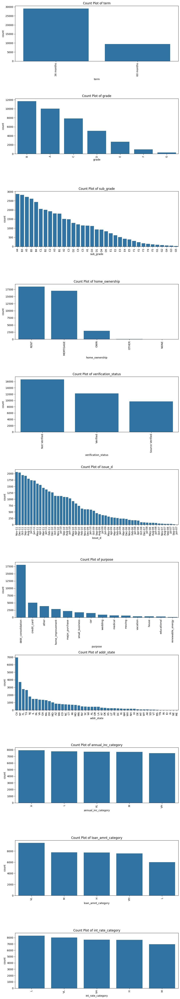

In [69]:

fig, axes = plt.subplots(num_cols, 1, figsize=(10, 5 * num_cols))
for i, col in enumerate(filtered_columns):
    sns.countplot(data=df, x=col, ax=axes[i],order=df[col].value_counts().sort_values(ascending=False).index)
    axes[i].set_title(f'Count Plot of {col}')
    axes[i].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

Key Insights:

1. Most applicants apply for short term loans (36 months)


2. B grade of loan systems prefered to A grade although not much can be said about sub_grades.


3. Most loan applicants have rented or mortaged homes each occupying approximately 41% of the population.


4. Most applicants status is not verified ( about 41% ).



5. If we notice the pattern of issuing loans in each year, we notice that more loans generally get issued near the end of the years generally October to December.



6. Mostly applicants apply for debt_consolidation loans (about 44%).


7. Applicants from CA state is quite dominant (approx 17%) followed by NewYork (approx 9% ).


8. Applicants from all income groups are present and nothing much can be said from this.



Handling the categories with extremely high values : We can re-categorize them.

For the date based columns, we can club them in quarterly values.

For emp_title we can consolidate the designations over fewer categories by analysing the distribution.

last_cr_pull_d - indicates the most recent month Lending Club pulled credit for this loan.

earliest_cr_line - The month the borrower's earliest reported credit line was opened.

Logically the month when the borrower's first credit was opened or the most recent month the club pulled his credit has not got much to do in deciding between paid or charged off applicants. Moreover, the earliest_cr_line was already used to find the derived column credit_history_length.

Hence dropping.

In [70]:
# dropping redundant columns
df.drop(columns=['last_credit_pull_d','earliest_cr_line'],inplace=True)

<ipython-input-70-1b7b667e5e54>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['last_credit_pull_d','earliest_cr_line'],inplace=True)


In [71]:
df['Last payment made']=np.where(df['last_pymnt_d']=='Not paid','Not paid','Paid')
df['Last payment made'].value_counts()

<ipython-input-71-1df03ad20a7d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Last payment made']=np.where(df['last_pymnt_d']=='Not paid','Not paid','Paid')


,count
Last payment made,
Paid,38506
Not paid,71


In [72]:
# dropping last_pymnt_d column
df.drop(columns=['last_pymnt_d'],inplace=True)

<ipython-input-72-267044a0df08>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['last_pymnt_d'],inplace=True)


There are 71 applicants who have never paid any amount at all and as seen earlier all of them have been correctly marked as charged off.

Checking emp_title values frequencies

Categorizing emp_titles and clubbing the varied infrequent employee titles under 'Other' category.

In [73]:
# bringing the common synonnymous titles under single title for reducing redundancy

df['emp_title'] = df['emp_title'].replace({'walmart': 'Walmart','WALMART': 'Walmart','WalMart': 'Walmart'})
df['emp_title'] = df['emp_title'].replace({'self': 'Self'})
df['emp_title'] = df['emp_title'].replace({'U.S. Army': 'US Army','US ARMY':'US Army','us army':'US Army','United States Army':'US Army'})
df['emp_title'] = df['emp_title'].replace({'United States Postal Service':'US Postal Service','USPS':'US Postal Service'})
df['emp_title'] = df['emp_title'].replace({'USAF':'US Air Force','United States Air Force':'US Air Force'})
df['emp_title'] = df['emp_title'].replace({'UPS':'United Parcel Service'})
df['emp_title'] = df['emp_title'].replace({'JPMorgan Chase':'JP Morgan Chase'})

<ipython-input-73-e96573e3e360>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['emp_title'] = df['emp_title'].replace({'walmart': 'Walmart','WALMART': 'Walmart','WalMart': 'Walmart'})
<ipython-input-73-e96573e3e360>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['emp_title'] = df['emp_title'].replace({'self': 'Self'})
<ipython-input-73-e96573e3e360>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [74]:
# categorizing infrequent emp titles under Other category

emptitles=df['emp_title'].value_counts()
mapper={title:title if count>=20 else 'Other' for title,count in emptitles.items()}
print(mapper)

{'Unknown': 'Unknown', 'US Army': 'US Army', 'US Air Force': 'US Air Force', 'Bank of America': 'Bank of America', 'US Postal Service': 'US Postal Service', 'Walmart': 'Walmart', 'United Parcel Service': 'United Parcel Service', 'JP Morgan Chase': 'JP Morgan Chase', 'IBM': 'IBM', 'Self': 'Self', 'AT&T': 'AT&T', 'Kaiser Permanente': 'Kaiser Permanente', 'Wells Fargo': 'Wells Fargo', 'Lockheed Martin': 'Lockheed Martin', 'Verizon Wireless': 'Verizon Wireless', 'Self Employed': 'Self Employed', 'Walgreens': 'Walgreens', 'State of California': 'State of California', 'Department of Defense': 'Department of Defense', 'Target': 'Target', 'Booz Allen Hamilton': 'Booz Allen Hamilton', 'US Navy': 'US Navy', 'Northrop Grumman': 'Northrop Grumman', 'Verizon': 'Verizon', 'Best Buy': 'Best Buy', 'Accenture': 'Accenture', 'Fidelity Investments': 'Fidelity Investments', 'Comcast': 'Comcast', 'Home Depot': 'Home Depot', 'Social Security Administration': 'Social Security Administration', 'Wells Fargo Ba

In [75]:
df['emp_title']=df['emp_title'].map(mapper)
df['emp_title'].value_counts()

<ipython-input-75-afcb3d671e28>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['emp_title']=df['emp_title'].map(mapper)


,count
emp_title,
Other,34216
Unknown,2386
US Army,272
US Air Force,145
Bank of America,107
US Postal Service,89
Walmart,78
United Parcel Service,77
JP Morgan Chase,70


In [76]:
df['emp_title'].nunique()

44

The emp_title categories reduced to 44 unique categories. Most people are clubbed in 'Others' category. Apart from the 'Other' and 'Unknown', the number of people in US Army and US Air Force have higher frequencies than the rest.

# Bivariate Analysis of loan_status with Numerical Columns

**Purpose** - To check how numerical columns influence the target column loan_status

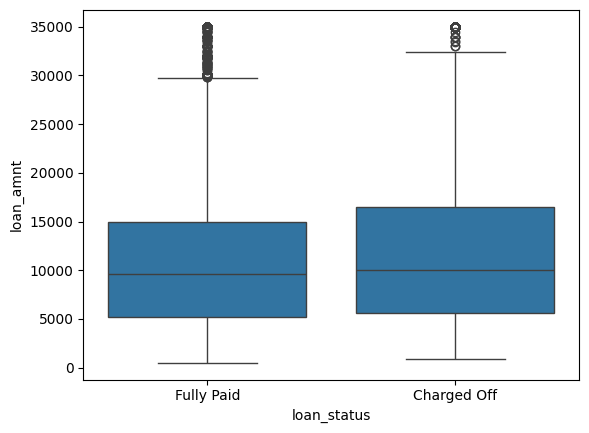

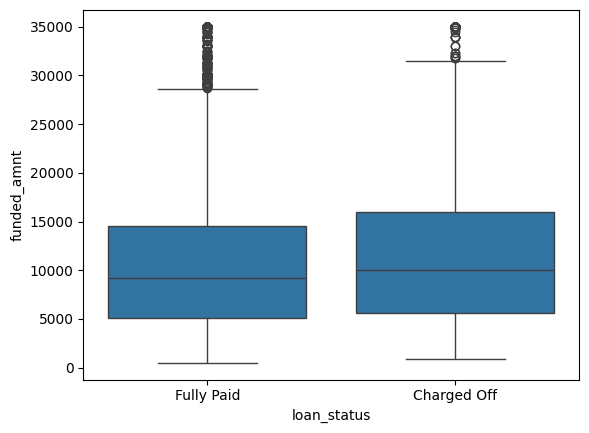

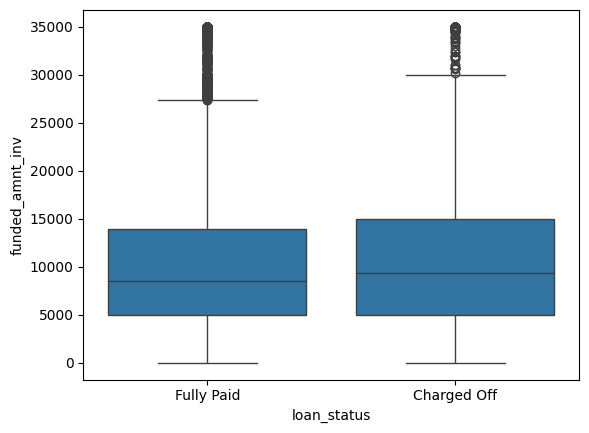

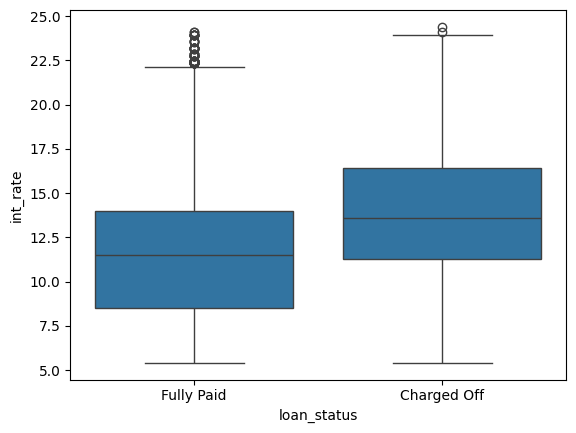

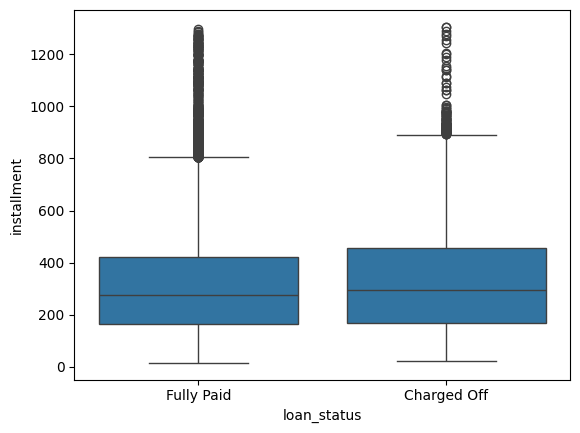

...

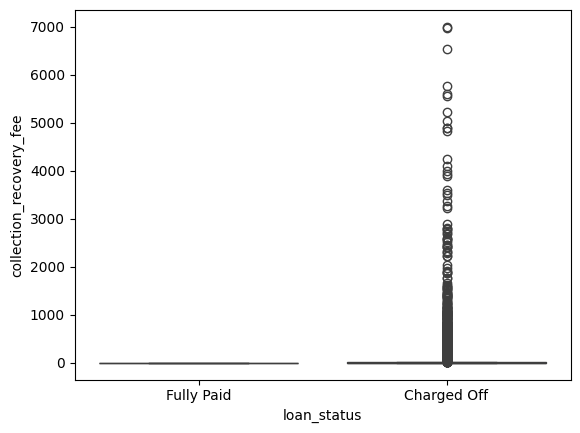

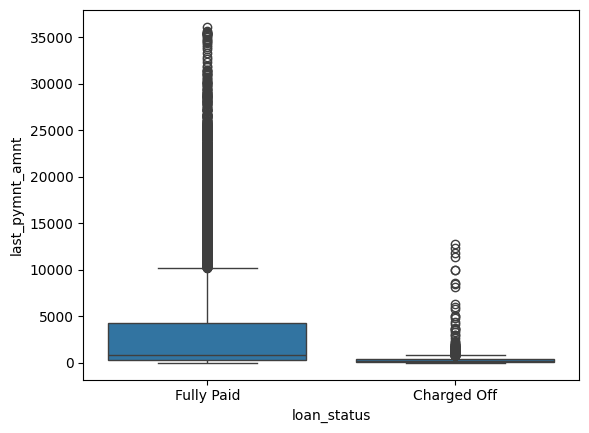

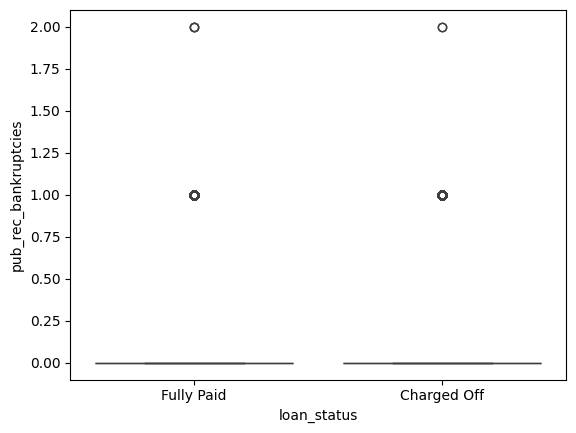

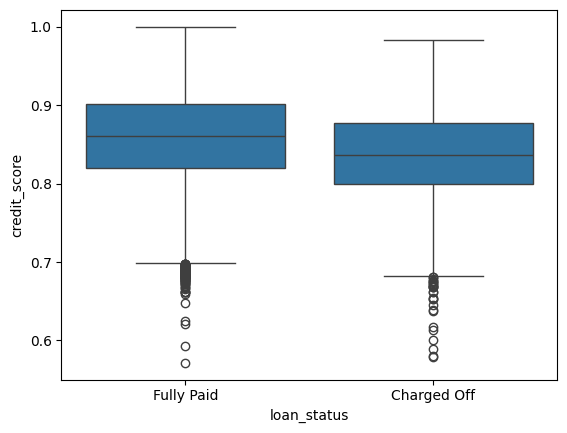

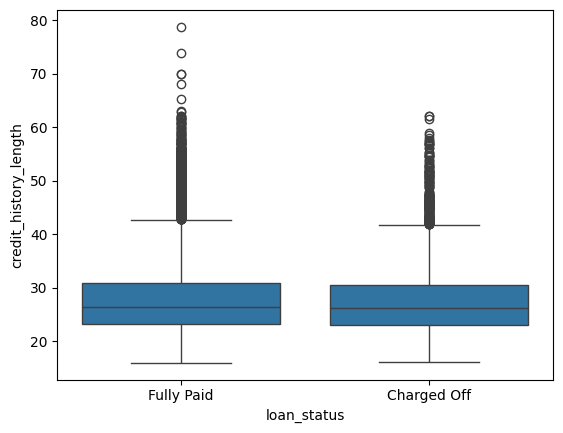

In [77]:
for col in numcols:
  sns.boxplot(data=df,x='loan_status',y=col)
  plt.show()

Key Insights:

1. The upper whisker which is the maximum accepted value of the range of the distribution is higher for Charged Off applicants and crossing 30,000.
More charged off applicants requested for higher loans. Although the median of the loan amount is similar for both charged off applicants and fully paid candidates, for the Charged Off applicants, the 75th percentile value for loan amounts is higher than that of fully paid ones, and crossing 15,000. This implies, that applicants demanding higher loans are not able to pay them and get charged off.

Since we saw earlier, that funded_amnt and funded_amnt_inv depend on loan_amnt, they follow similar nature.

To prevent charged off cases, it is advised not to offer very high loans.


2. Applicants with high interest rate on their loans get charged off more. From the int_rate plots, we see that the median value of interest rate for Charged Off applicants are much higher than the paid ones (crossing 12.5%). The maximum value of the range is also higher (crossing 22.5%) for charged off applicants than paid ones. This implies all applicants cannot afford high interest rate and get charged off.

It is advised to keep a reasonable interest rate to avoid defaulter cases.


3. Applicants providing higher amount of installments are charged off because they cannot consistently provide the high installment amount throughout the term.


4. Applicants with medium level of employeement experience (4 to 8 yrs) comprise a greater portion of the Charged Off applicants population. Although that does not imply much.


5. Charged off applicants have a slightly higher dti ( debt to income ratio ) indicating that they might rely too much on loans and cannot keep up with all the debts.


6. For column revol_util (revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit), a higher proportion of Charged Off population has a higher value. This is evident from the higher median, 25th percentile and 75th percentile values.


7. The plots related to total payment received (total_pymnt, total_pymnt_inv, total_rec_prncp, total_rec_inv) are self-explanatory, where Charged Off applicants naturally have a lower proportion because they are not paying much.


8. For the visual, total_rec_late_fee, not many applicants paid late fee, but Charged Off applicants have greater outliers who have paid high late fee (higher than the fees of fully paid applicants). But we observe, even fully paid applicants were fined for paying late. So if somebody is paying high late fees there is a slight indication that the person might default.


9. The plots related to recoveries collected (recoveries,collection_recovery_fee) are self-explanatory, where Charged Off applicants naturally have a higher proportion. The presence of many outliers imply that although from many Charged Off applicants, recovery fees has been received, a significantly high proportion of charged off applicants have provided 0 or very nominal recovery fee.


10. Visual for inq_last_6mnths show Charged Off borrowers inquired more for the last 6 months, probably seeking more credits and having discussions due to the hindrances they were facing while paying the dues.


11. Plot for pub_rec_bankruptcies dont carry much useful information. Very few people were bankrupted as per outliers, and some of them fully paid loans even after having public bankruptcy records. Majority people had clean records.

12. Charged Off borrowers have lower credit score. Credit score below 0.8 should be treated with caution.


Since emp_length and pub_rec_bankruptcies are discrete numerical values let us plot and see percentage of charged off applicants for each value.

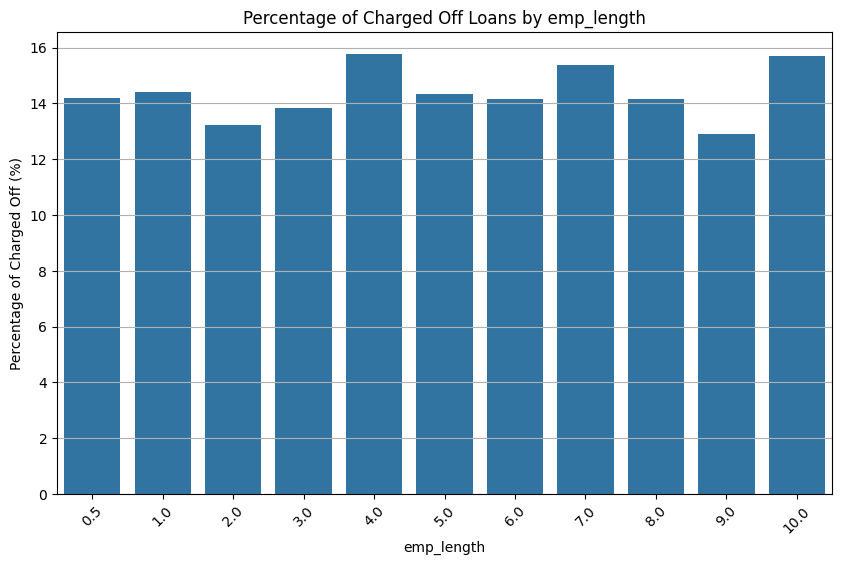

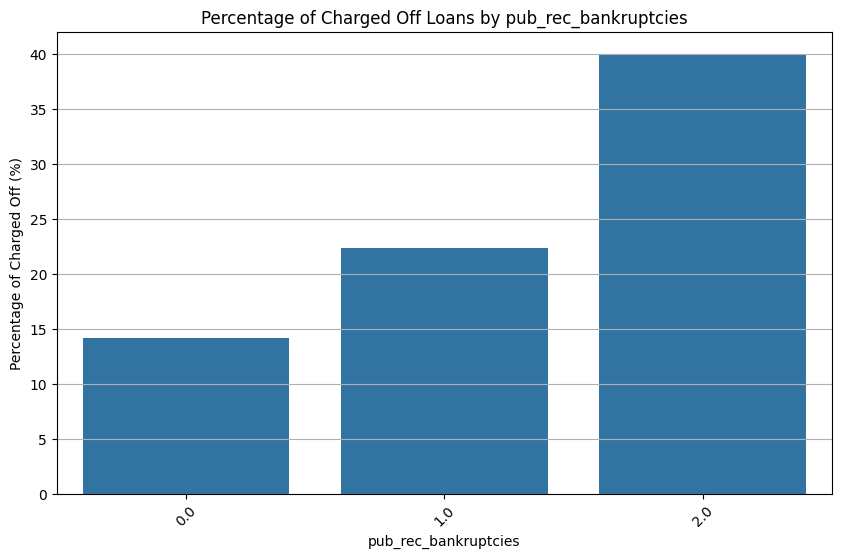

In [78]:
columns_to_analyze = ['emp_length', 'pub_rec_bankruptcies']

for col in columns_to_analyze:
    # Calculate the percentage of charged off loans for each column
    charged_off_percentage = (
        df.groupby(col)['loan_status']
        .value_counts(normalize=True)
        .unstack()
        .fillna(0) * 100
    )

    # Create a DataFrame for plotting
    charged_off_percentage = charged_off_percentage['Charged Off'].reset_index()

    # Plotting
    plt.figure(figsize=(10, 6))
    sns.barplot(data=charged_off_percentage, x=col, y='Charged Off')
    plt.title(f'Percentage of Charged Off Loans by {col}')
    plt.ylabel('Percentage of Charged Off (%)')
    plt.xlabel(col)
    plt.xticks(rotation=45)
    plt.grid(axis='y')
    plt.show()

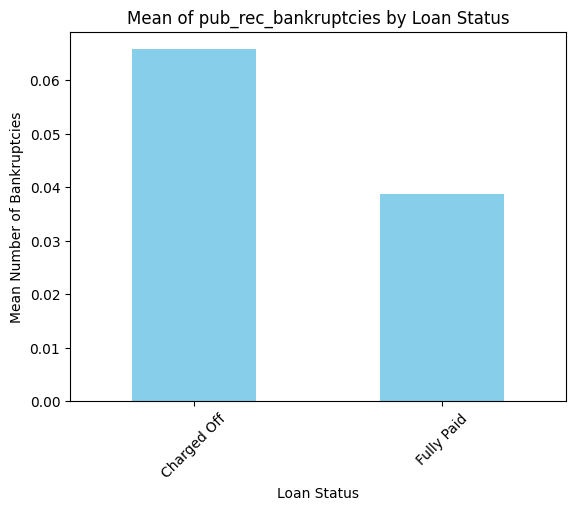

In [79]:
mean_result = df.groupby('loan_status')['pub_rec_bankruptcies'].mean()

# Plot
mean_result.plot(kind='bar', color='skyblue')
plt.title('Mean of pub_rec_bankruptcies by Loan Status')
plt.xlabel('Loan Status')
plt.ylabel('Mean Number of Bankruptcies')
plt.xticks(rotation=45)
plt.show()

Key Insights:

Very few people had bankruptcy records. For those who had such records, the proportion of charge off rate is high. Charged off borrowers had more bankruptcies on an average than fully paid ones.


# Bivariate Analysis of loan_status with Categorical Columns

**Purpose** - To understand how the categorical variables influence target column loan_status

In [80]:
objectcols=df.select_dtypes(include=['object','category'])
objectcols.nunique()

,0
term,2
grade,7
sub_grade,35
emp_title,44
home_ownership,5
verification_status,3
issue_d,55
loan_status,2
purpose,14
addr_state,50


In [81]:
unique_counts = objectcols.nunique()
filtered_columns = unique_counts.index
num_cols = len(filtered_columns)

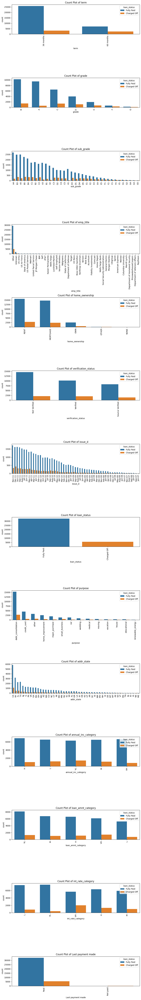

In [82]:

fig, axes = plt.subplots(num_cols, 1, figsize=(10, 5 * num_cols))
for i, col in enumerate(filtered_columns):
    sns.countplot(data=df, x=col, hue='loan_status', ax=axes[i],order=df[col].value_counts().sort_values(ascending=False).index)
    axes[i].set_title(f'Count Plot of {col}')
    axes[i].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()


In above plots we see the number of 'fully paid' and 'charged off' borrowers for each categorical column. However it would be good to see the percentage proportion of Charged Off borrowers with respect to the categorical columns

In [83]:
filtered_columns

Index(['term', 'grade', 'sub_grade', 'emp_title', 'home_ownership',
       'verification_status', 'issue_d', 'loan_status', 'purpose',
       'addr_state', 'annual_inc_category', 'loan_amnt_category',
       'int_rate_category', 'Last payment made'],
      dtype='object')

Plotting percentage of Charged Offs for better visualization

In [84]:
# List of input categorical columns

input_columns =[]

filtered_columns_lis=filtered_columns.tolist()

filtered_columns_lis.remove('loan_status')

filtered_columns_lis.remove('emp_title')

input_columns.extend(filtered_columns_lis)

print(input_columns)

# Create a figure for the plots
num_cols = len(input_columns)

['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status', 'issue_d', 'purpose', 'addr_state', 'annual_inc_category', 'loan_amnt_category', 'int_rate_category', 'Last payment made']


<ipython-input-85-c13ab43be07b>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  charged_off_percentage = df.groupby(col)['loan_status'].value_counts(normalize=True).unstack().fillna(0) * 100
<ipython-input-85-c13ab43be07b>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  charged_off_percentage = df.groupby(col)['loan_status'].value_counts(normalize=True).unstack().fillna(0) * 100
<ipython-input-85-c13ab43be07b>:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the fu

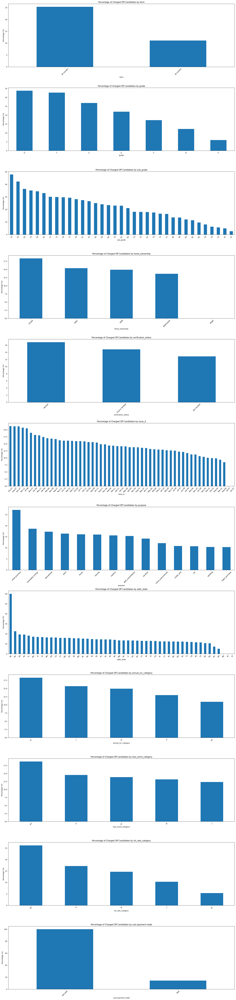

In [85]:

#fig, axes = plt.subplots(num_cols, 1, figsize=(45, 12 * num_cols))


fig, axes = plt.subplots(num_cols, 1, figsize=(20, 7 * num_cols))

# Loop through each input column
for i, col in enumerate(input_columns):
    # Calculate the percentage of Charged Off candidates
    charged_off_percentage = df.groupby(col)['loan_status'].value_counts(normalize=True).unstack().fillna(0) * 100

    charged_off_sorted = charged_off_percentage['Charged Off'].sort_values(ascending=False)
    #print(charged_off_sorted)

    # Plot the percentage of Charged Off
    charged_off_sorted.plot(kind='bar', ax=axes[i])
    axes[i].set_title(f'Percentage of Charged Off Candidates by {col}')
    axes[i].set_ylabel('Percentage (%)')
    axes[i].set_xlabel(col)
    axes[i].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

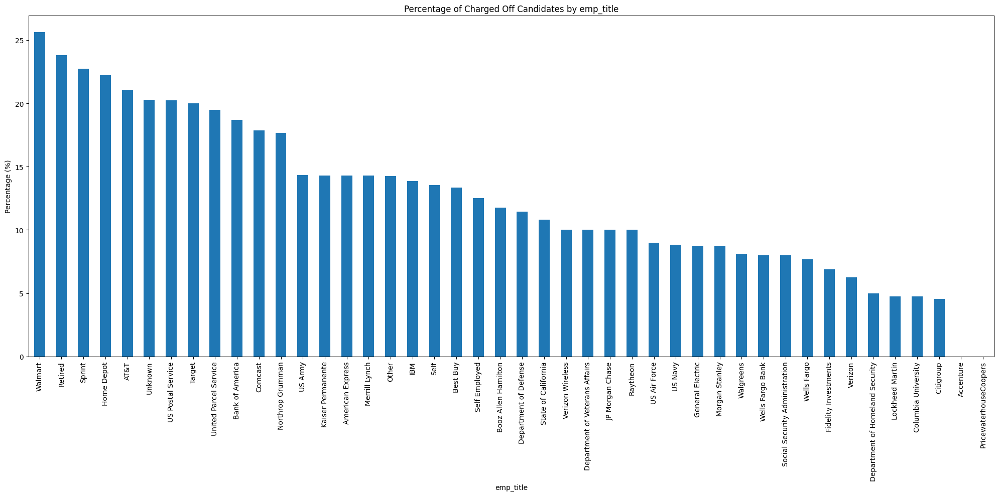

In [86]:
# viewing charged off percentage per emp_title separately for better visualising
plt.figure(figsize=(20,10))
# Calculate the percentage of Charged Off candidates
col='emp_title'
charged_off_percentage = df.groupby(col)['loan_status'].value_counts(normalize=True).unstack().fillna(0) * 100

charged_off_sorted = charged_off_percentage['Charged Off'].sort_values(ascending=False)
#print(charged_off_sorted)

# Plot the percentage of Charged Off
charged_off_sorted.plot(kind='bar')
plt.title(f'Percentage of Charged Off Candidates by {col}')
plt.ylabel('Percentage (%)')
plt.xlabel(col)
plt.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

<ipython-input-87-1590362ca1dc>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby([col, 'loan_status']).size().unstack(fill_value=0)
<ipython-input-87-1590362ca1dc>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby([col, 'loan_status']).size().unstack(fill_value=0)
<ipython-input-87-1590362ca1dc>:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby([col, 'loan_status'

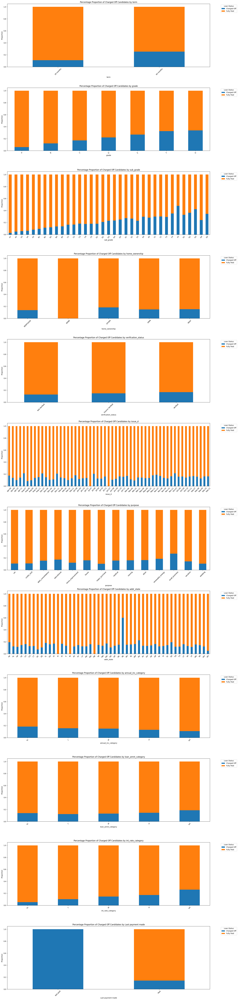

In [87]:
# Create a figure for the plots
num_cols = len(input_columns)
#fig, axes = plt.subplots(num_cols, 1, figsize=(45, 12 * num_cols))
fig, axes = plt.subplots(num_cols, 1, figsize=(20, 7 * num_cols))

# Loop through each input column
for i, col in enumerate(input_columns):
    counts = df.groupby([col, 'loan_status']).size().unstack(fill_value=0)
    # Calculate the proportion of each category
    proportions = counts.div(counts.sum(axis=1), axis=0)

    # Plot the percentage proportion of Charged Off
    proportions.plot(kind='bar', stacked=True,ax=axes[i])
    axes[i].set_title(f'Percentage Proportion of Charged Off Candidates by {col}')
    axes[i].set_ylabel('Proportion')
    axes[i].set_xlabel(col)
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<Figure size 4000x2000 with 0 Axes>

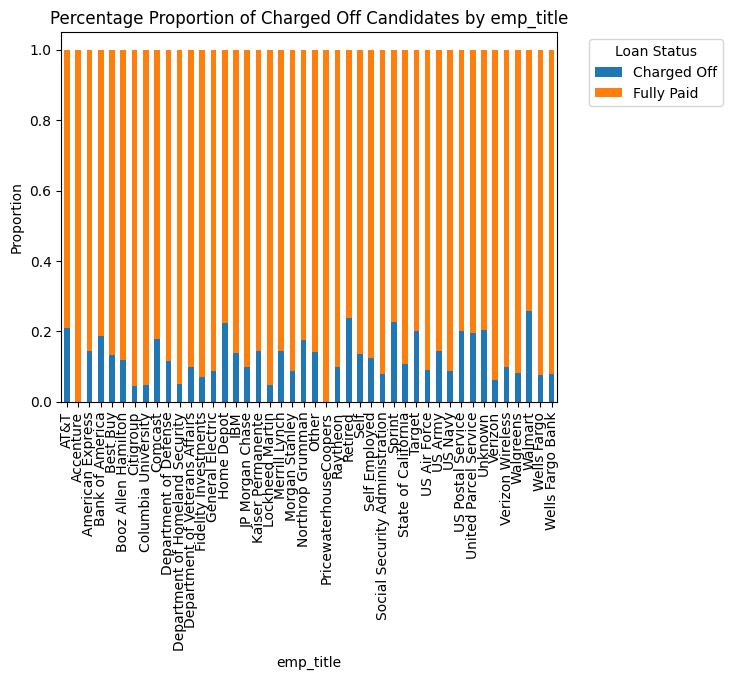

In [88]:
# viewing charged off percentage per emp_title separately for better visualising

# Calculate the percentage of Charged Off candidates
col='emp_title'
plt.figure(figsize=(40,20))
counts = df.groupby([col, 'loan_status']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plot the percentage proportion of Charged Off
proportions.plot(kind='bar', stacked=True)
plt.title(f'Percentage Proportion of Charged Off Candidates by {col}')
plt.ylabel('Proportion')
plt.xlabel(col)
plt.tick_params(axis='x', rotation=90)
plt.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')


#plt.tight_layout()
plt.show()

Key Insights:

1. Higher the loan amount loan_amnt, higher the charge off percentage. To keep charge off rate below 15%, by scrutinizing the all the loan_amnt visuals, its recommended that loan amounts should be maintained within range of 500 to 16,000 as per the range values of VL,L,M,H category buckets.


2. Higher the interest rate int_rate, more is charge off percentage. To keep Charge Off percentage near 10% select low (L: 7.9 - 10.99) or very low (VL: 5.42 - 7.90) interest rates.


3. Borrowers with long term loans get charged off more.


4. As loan grade / sub grade increases from A to G (calling A as lowest grade and G as highest grade), the percentage of Charge Off increases.


5. Borrowers with emp_title Walmart get charged off more.


6. As per univariate analysis of home_ownership, rent and mortage comprise nearly approximately 44% (highest proportion) of the data individually. Out of that, approximately 15% are charged off. 'Other' category comprises a very small portion but still shows highest percentage of defaulters. But difference in the charged off proportions across the home ownership categories is very less.


7. About 41% (highest proportion) of the borrower population are not verified. Out of them about 13% are getting charged off. Attention needs to be given towards their verification. However borrowers with verified status also show a significant percentage of getting charged off.


8. Month of issue of loan do not strongly imply any significant pattern.


9. Applicants borrowing loan for small business purpose charge off more , (about 26%) probably because they suffer loss and cannot repay. But the portion of borrowers taking loans for this purpose is 6% only. Borrowers with purpose of debt consolidation occupy about 44% of the population. Their charge off rate is about 15%.


10. Among the states, NE shows highest percentage of charged off applicants (nearly 60%). CA, which has maximum number of applicants from its region have about 18% charge off rates.


11. As income decreases, percentage of charge off increases.


12. Most of the defaulters, dont pay any amount.

# Multivariate Analysis

**Purpose** - To check how each column influences the other and also to check how target column loan_status behaves when segmented across 2 variables.

Checking correlations

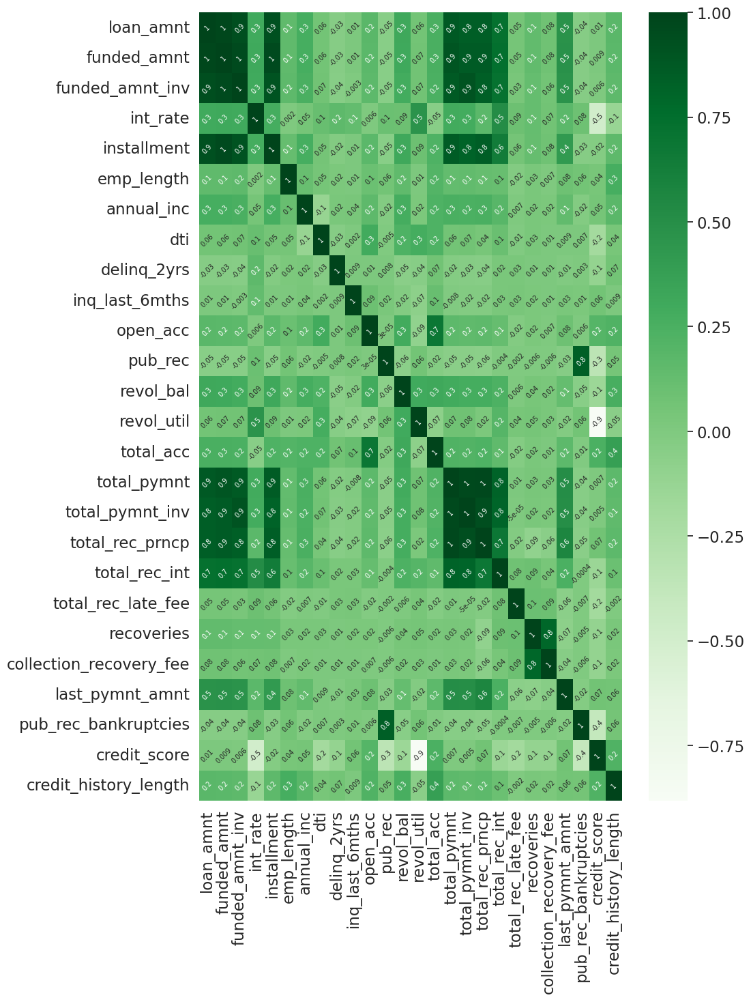

In [89]:
plt.figure(figsize=(10,15))
sns.set(font_scale=1.5)
sns.heatmap(df[numcols].corr(),annot=True,fmt='.1g', annot_kws={"rotation": 45,"size": 7},cmap='Greens')
plt.show()

In [90]:
# extracting those columns with medium to high positive correlation

# Assuming df is your DataFrame and numcols contains the numeric columns
correlation_matrix = df[numcols].corr()

# Function to get pairs of columns based on correlation threshold
def get_correlated_pairs(corr_matrix, lower_bound, upper_bound):
    pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            # Only consider values in the specified range and avoid self-correlation
            if lower_bound < corr_matrix.iloc[i, j] < upper_bound:
                pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))
    return pairs

# Get pairs for correlation between 0.3 and 0.7
pairs_0_3_to_0_7 = get_correlated_pairs(correlation_matrix, 0.3, 0.7)

# Get pairs for correlation between 0.7 and 1
pairs_0_7_to_1 = get_correlated_pairs(correlation_matrix, 0.7, 1)

# Print the results
print("Pairs with correlation from 0.3 to 0.7:")
for col1, col2, corr_value in pairs_0_3_to_0_7:
    print(f"{col1} and {col2}: {round(corr_value,1)}")

print("\nPairs with correlation from 0.7 to 1:")
for col1, col2, corr_value in pairs_0_7_to_1:
    print(f"{col1} and {col2}: {round(corr_value,1)}")


Pairs with correlation from 0.3 to 0.7:
int_rate and loan_amnt: 0.3
int_rate and funded_amnt: 0.3
revol_bal and loan_amnt: 0.3
revol_bal and funded_amnt: 0.3
revol_bal and installment: 0.3
revol_util and int_rate: 0.5
revol_util and revol_bal: 0.3
total_acc and open_acc: 0.7
total_acc and revol_bal: 0.3
total_rec_int and int_rate: 0.5
total_rec_int and installment: 0.6
total_rec_int and total_rec_prncp: 0.7
last_pymnt_amnt and loan_amnt: 0.5
last_pymnt_amnt and funded_amnt: 0.5
last_pymnt_amnt and funded_amnt_inv: 0.5
last_pymnt_amnt and installment: 0.4
last_pymnt_amnt and total_pymnt: 0.5
last_pymnt_amnt and total_pymnt_inv: 0.5
last_pymnt_amnt and total_rec_prncp: 0.6
credit_history_length and total_acc: 0.4

Pairs with correlation from 0.7 to 1:
funded_amnt and loan_amnt: 1.0
funded_amnt_inv and loan_amnt: 0.9
funded_amnt_inv and funded_amnt: 1.0
installment and loan_amnt: 0.9
installment and funded_amnt: 1.0
installment and funded_amnt_inv: 0.9
total_pymnt and loan_amnt: 0.9
total

In [91]:
# extracting those columns with medium to high negative correlation

# Assuming df is your DataFrame and numcols contains the numeric columns
correlation_matrix = df[numcols].corr()

# Function to get pairs of columns based on correlation threshold
def get_correlated_pairs(corr_matrix, lower_bound, upper_bound):
    pairs = []
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            # Only consider values in the specified range and avoid self-correlation
            if lower_bound < corr_matrix.iloc[i, j] < upper_bound:
                pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))
    return pairs

# Get pairs for correlation between 0.3 and 0.7
pairs_0_3_to_0_7 = get_correlated_pairs(correlation_matrix, -0.3, -0.7)

# Get pairs for correlation between 0.7 and 1
pairs_0_7_to_1 = get_correlated_pairs(correlation_matrix, -0.7, -1)

# Print the results
print("Pairs with correlation from -0.3 to -0.7:")
for col1, col2, corr_value in pairs_0_3_to_0_7:
    print(f"{col1} and {col2}: {round(corr_value,1)}")

print("\nPairs with correlation from -0.7 to -1:")
for col1, col2, corr_value in pairs_0_7_to_1:
    print(f"{col1} and {col2}: {round(corr_value,1)}")

Pairs with correlation from -0.3 to -0.7:

Pairs with correlation from -0.7 to -1:


Checking loan status variations with annual income, grades, interest rate, loan amounts.

<ipython-input-92-fa82b7893b43>:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


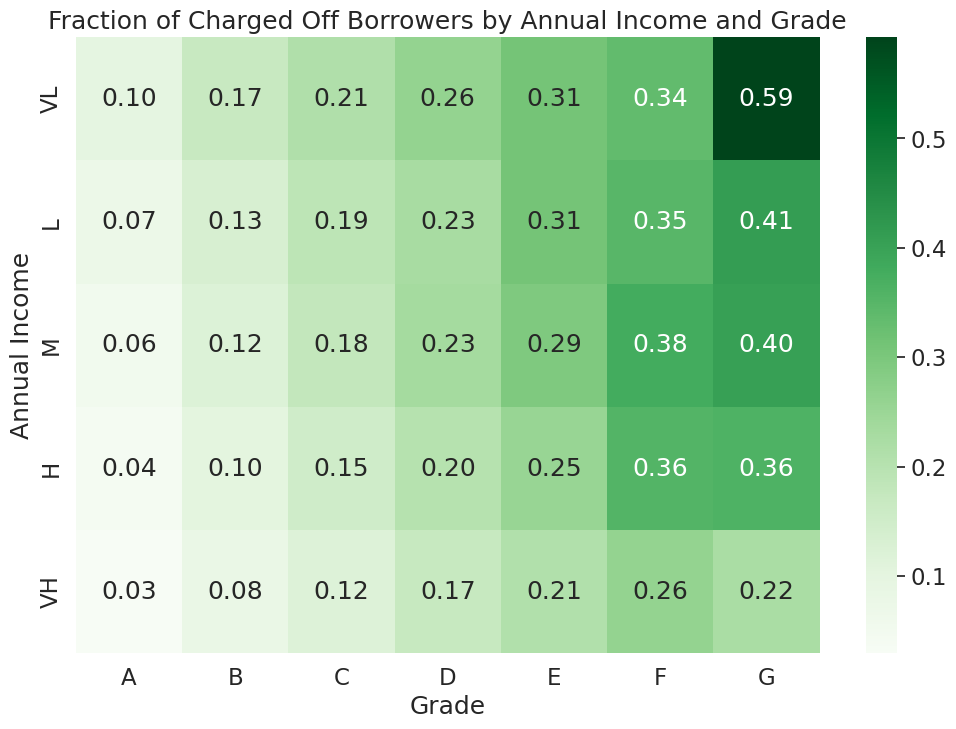

In [92]:
# Create a pivot table
pivot_table = df.pivot_table(
    index='annual_inc_category',
    columns='grade',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Annual Income and Grade')
plt.ylabel('Annual Income')
plt.xlabel('Grade')
plt.show()

<ipython-input-93-212093ccdbc8>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


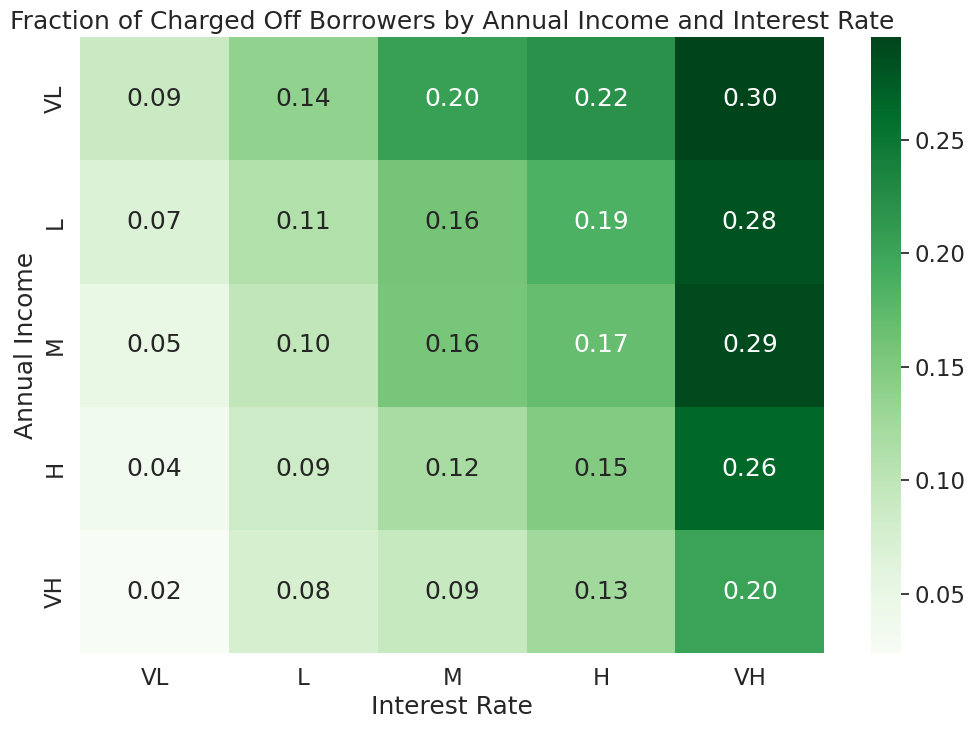

In [93]:
pivot_table = df.pivot_table(
    index='annual_inc_category',
    columns='int_rate_category',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Annual Income and Interest Rate')
plt.ylabel('Annual Income')
plt.xlabel('Interest Rate')
plt.show()

As grade increases, the charged off proportion also increases and same pattern observed for interest rate. The greatest risk is with the lower income applicants. From this we can also infer that as grade increases from A to G, the interest rate increases. Interest rate at G is greater than at grade A so G grade is riskier than A.

<ipython-input-94-629be775a55d>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['annual_inc_category', 'grade']).size().unstack(fill_value=0)


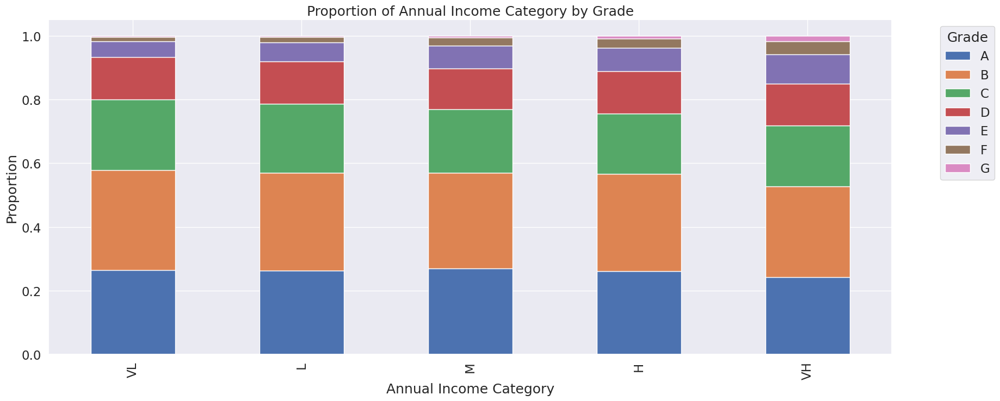

In [94]:
counts = df.groupby(['annual_inc_category', 'grade']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Annual Income Category by Grade')
plt.ylabel('Proportion')
plt.xlabel('Annual Income Category')
plt.legend(title='Grade', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Applicants from all income groups mostly prefer A grade and B grade loans but proportion of applicants with B grade loans is slightly higher than A. Since as per heatmap the charge off rate for B grade loans is higher than that of A, grade A should be prioritised.

<ipython-input-95-ad029a3188d9>:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


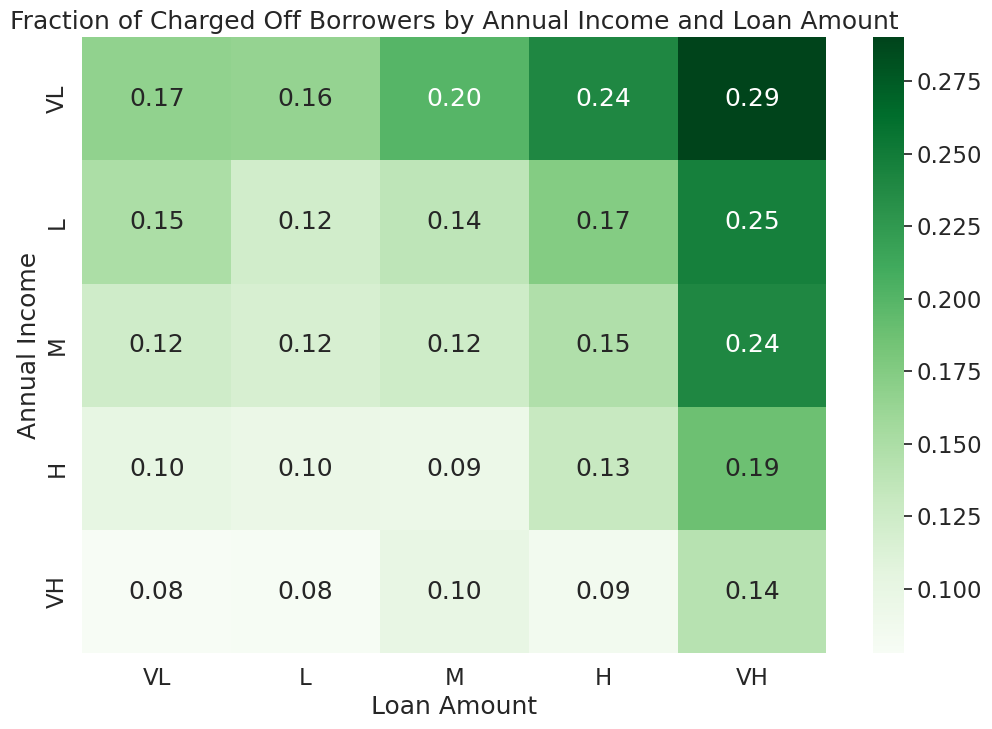

In [95]:
# Create a pivot table
pivot_table = df.pivot_table(
    index='annual_inc_category',
    columns='loan_amnt_category',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Annual Income and Loan Amount')
plt.ylabel('Annual Income')
plt.xlabel('Loan Amount')
plt.show()

<ipython-input-96-74a2cd6d252d>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['annual_inc_category', 'loan_amnt_category']).size().unstack(fill_value=0)


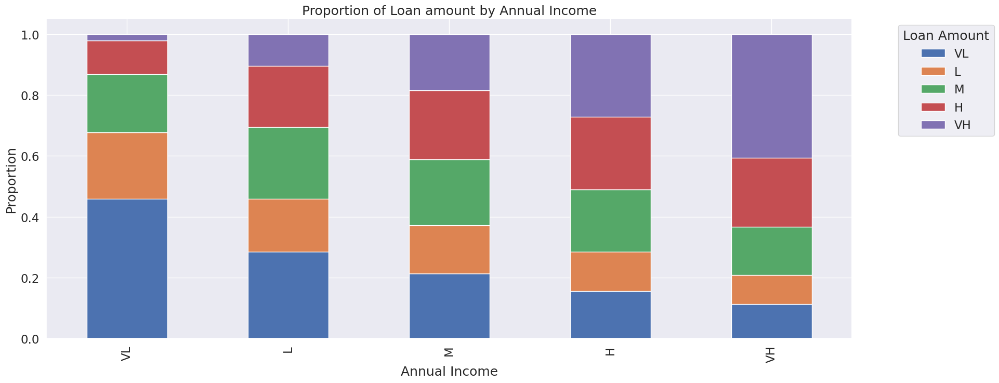

In [96]:
counts = df.groupby(['annual_inc_category', 'loan_amnt_category']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Loan amount by Annual Income')
plt.ylabel('Proportion')
plt.xlabel('Annual Income')
plt.xticks(rotation=90)
plt.legend(title='Loan Amount', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<ipython-input-97-e2e4acfa71f1>:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


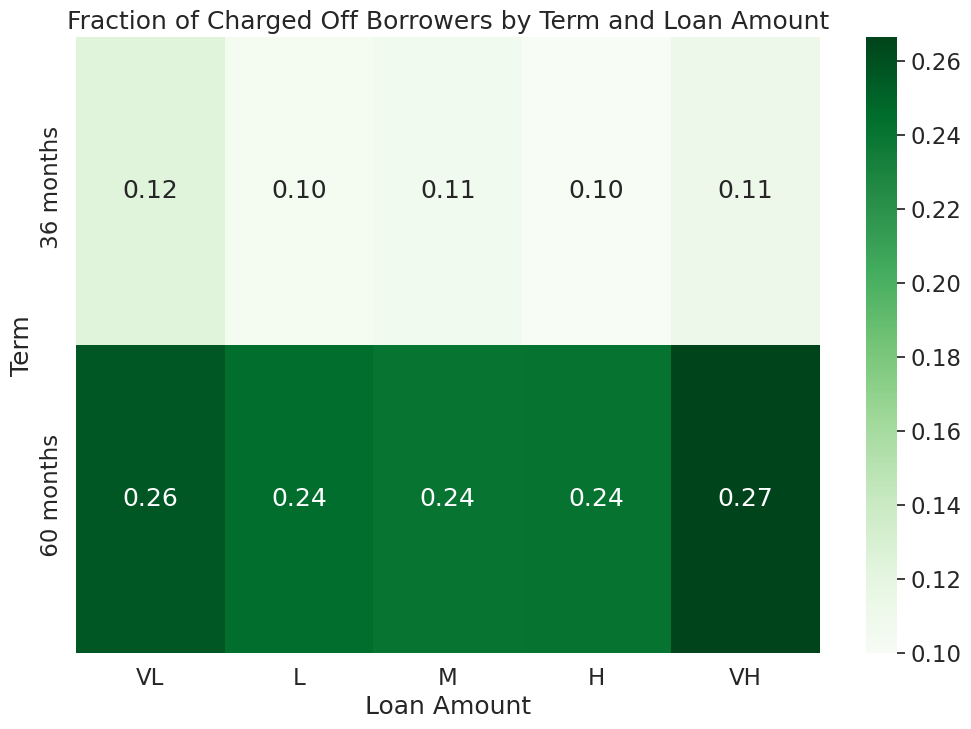

In [97]:
# Create a pivot table
pivot_table = df.pivot_table(
    index='term',
    columns='loan_amnt_category',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Term and Loan Amount')
plt.ylabel('Term')
plt.xlabel('Loan Amount')
plt.show()

<ipython-input-98-8d9aa48ab581>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


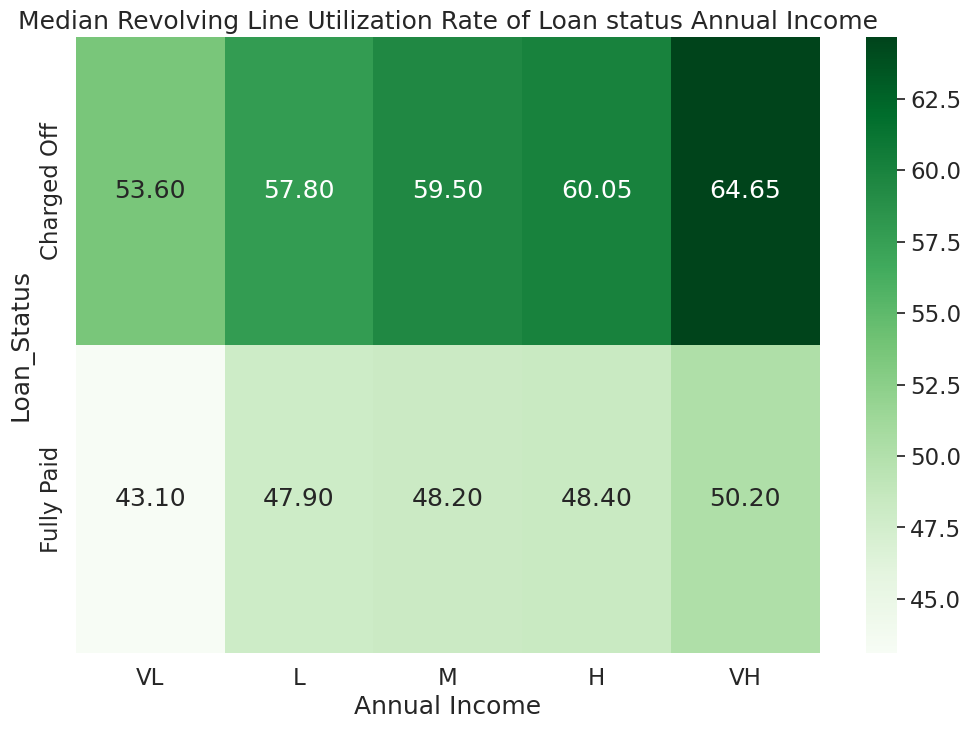

In [98]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='annual_inc_category',
    values='revol_util',
    aggfunc='median'  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)



# Plotting the heatmap
plt.figure(figsize=(12,8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Median Revolving Line Utilization Rate of Loan status Annual Income')
plt.ylabel('Loan_Status')
plt.xlabel('Annual Income')
plt.show()

Median employment length for different combinations of loan status and annual income categories

In [99]:
loan_counts = df.groupby('annual_inc_category')['loan_status'].count()
charged_off_counts = df[df['loan_status'] == 'Charged Off'].groupby('annual_inc_category')['loan_status'].count()

# Calculate default rate
default_rates = (charged_off_counts / loan_counts) * 100

<ipython-input-99-e3380ce12df6>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  loan_counts = df.groupby('annual_inc_category')['loan_status'].count()
<ipython-input-99-e3380ce12df6>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  charged_off_counts = df[df['loan_status'] == 'Charged Off'].groupby('annual_inc_category')['loan_status'].count()


In [100]:
emp_length_pivot = df.pivot_table(
    index='annual_inc_category',
    columns='loan_status',
    values='emp_length',
    aggfunc='median'
)

# Rename columns for clarity
emp_length_pivot.columns = ['Charged Off Emp Length', 'Fully Paid Emp Length']

# Add default rate to the pivot table
emp_length_pivot['Default Rate'] = default_rates

<ipython-input-100-1e0c64ddb83e>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  emp_length_pivot = df.pivot_table(


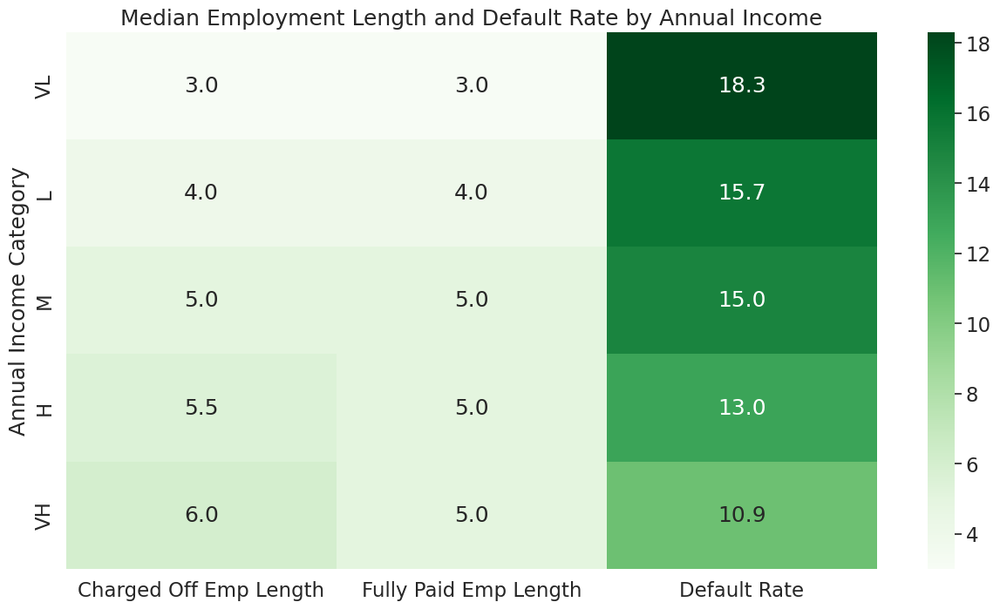

In [101]:
plt.figure(figsize=(15,8))
sns.heatmap(emp_length_pivot, cmap='Greens', annot=True, fmt='.1f')
plt.title('Median Employment Length and Default Rate by Annual Income')
plt.ylabel('Annual Income Category')
plt.show()

Key Insights:

Income appears to be a stronger predictor of default risk than employment length. As income increases, default rates consistently decrease. Employment length doesn't show a clear correlation with default rates across income categories. This suggests that income level may be more important in predicting loan repayment than length of employment. The Very High income category shows an interesting pattern with longer employment length for charged off loans. This could indicate that for high earners, factors other than job stability might be influencing default risk. The difference in default rates between the lowest and highest income categories is significant (18.3% vs 10.9%), suggesting that income-based risk assessment could be valuable.

As per bivariate analysis of categorical columns, borrowers with smaller_business purpose charge off more. Let us check loan status variations with purpose and other driving factors.

<ipython-input-102-dc6bb3c5ead4>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['purpose', 'annual_inc_category']).size().unstack(fill_value=0)


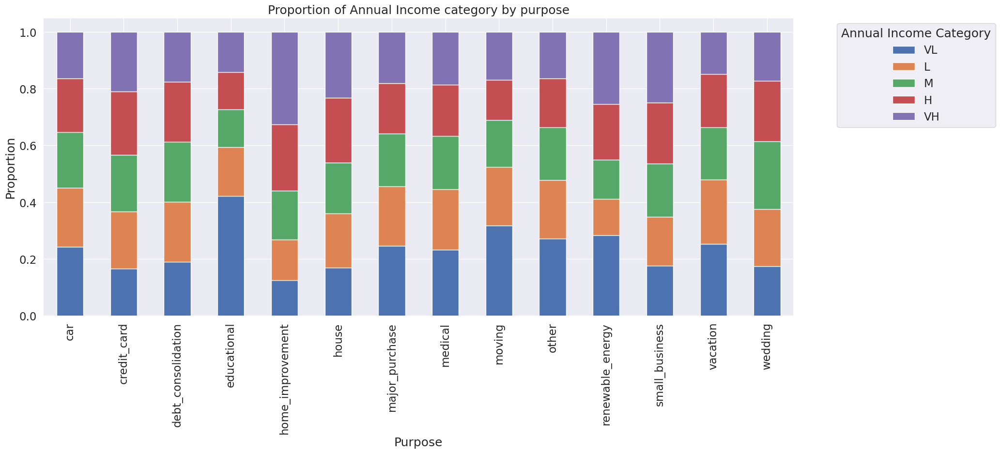

In [102]:
counts = df.groupby(['purpose', 'annual_inc_category']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Annual Income category by purpose')
plt.ylabel('Proportion')
plt.xlabel('Purpose')
plt.legend(title='Annual Income Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

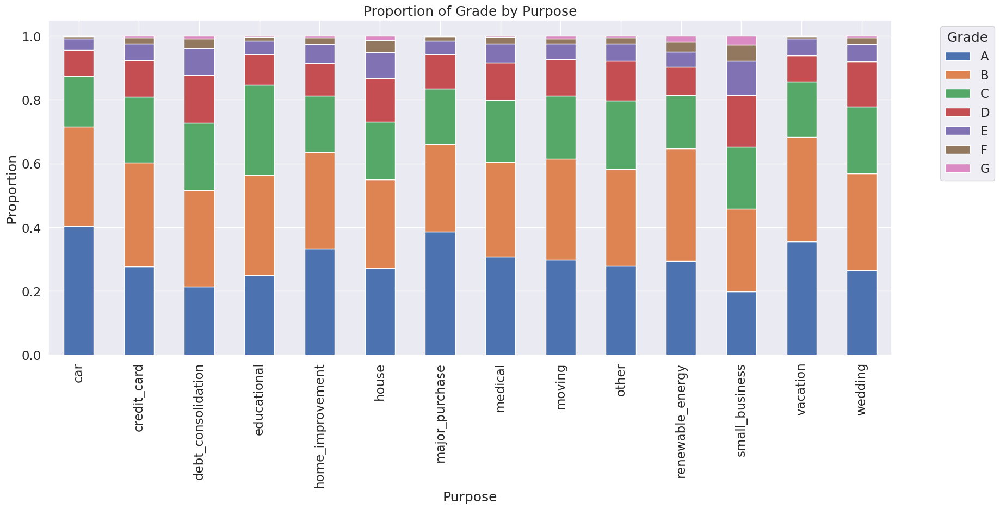

In [103]:
counts = df.groupby(['purpose', 'grade']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Grade by Purpose')
plt.ylabel('Proportion')
plt.xlabel('Purpose')
plt.xticks(rotation=90)
plt.legend(title='Grade', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<ipython-input-104-73eab8af7d79>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['purpose', 'int_rate_category']).size().unstack(fill_value=0)


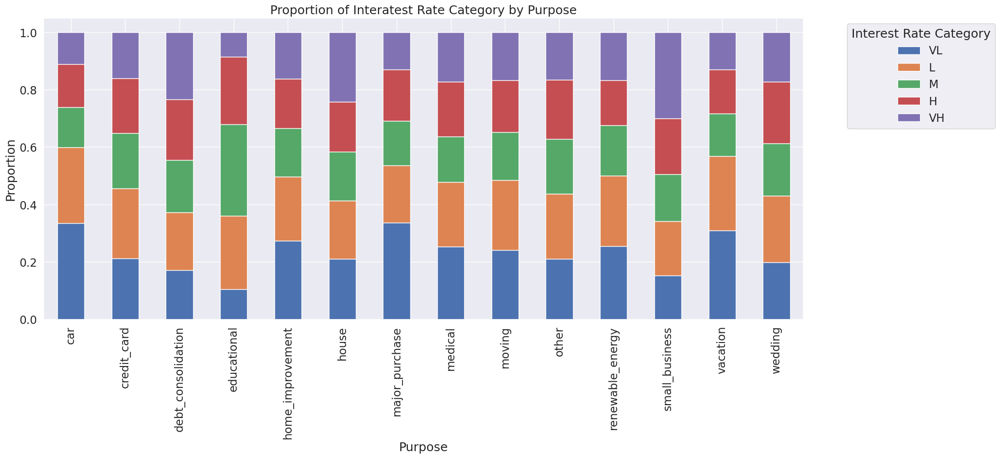

In [104]:
counts = df.groupby(['purpose', 'int_rate_category']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Interatest Rate Category by Purpose')
plt.ylabel('Proportion')
plt.xlabel('Purpose')
plt.xticks(rotation=90)
plt.legend(title='Interest Rate Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

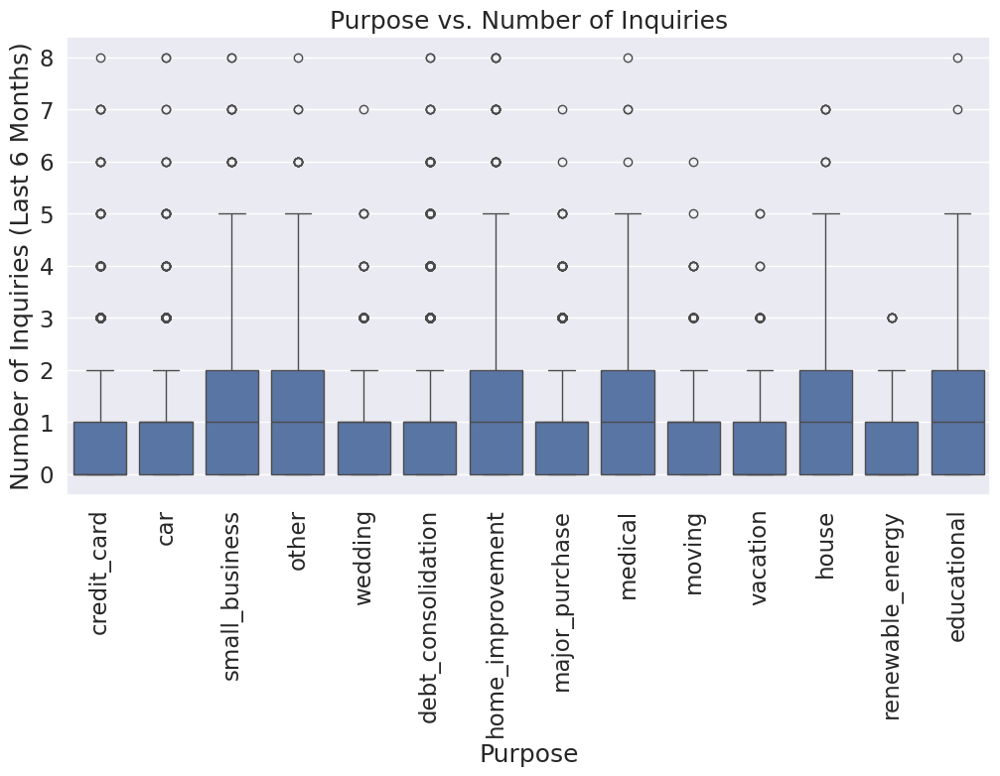

In [105]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='purpose', y='inq_last_6mths')
plt.title('Purpose vs. Number of Inquiries')
plt.xlabel('Purpose')
plt.ylabel('Number of Inquiries (Last 6 Months)')
plt.xticks(rotation=90)
plt.show()

Key Insights:

Applicants with small business purpose are charging off most, because to make up for their financial losses, they are taking more higher grade loans with higher interest rate and doing more inquiries for more credits, struggling with credit repay and consequently charging off.

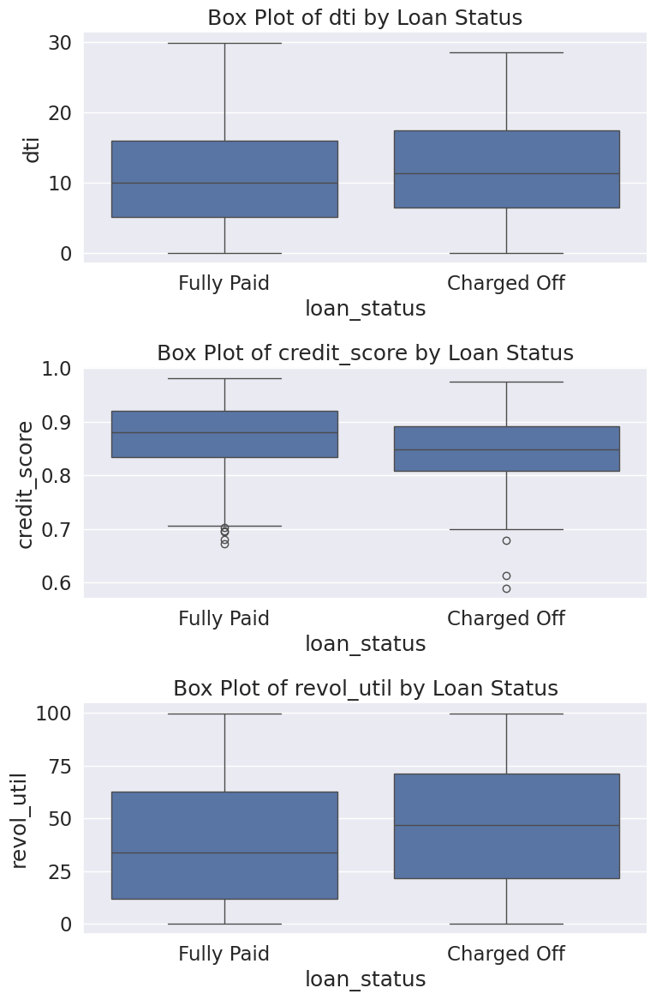

In [106]:
df_small_business=df[df['purpose']=='small_business']
# List of columns to plot
columns_to_plot = ['dti', 'credit_score','revol_util']

# Create box plots for each column
plt.figure(figsize=(8,12))
for i, column in enumerate(columns_to_plot):
    plt.subplot(len(columns_to_plot), 1, i + 1)
    sns.boxplot(x='loan_status', y=column, data=df_small_business)
    plt.title(f'Box Plot of {column} by Loan Status')

plt.tight_layout()
plt.show()

<ipython-input-107-de0296012b83>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  charged_off_percentage = df_small_business.groupby(col)['loan_status'].value_counts(normalize=True).unstack().fillna(0) * 100


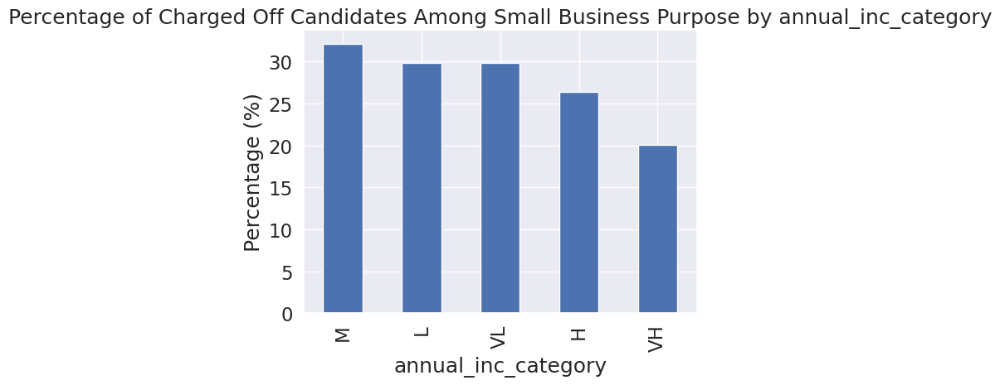

In [107]:
plt.figure(figsize=(6,5))
# Calculate the percentage of Charged Off candidates
col='annual_inc_category'
charged_off_percentage = df_small_business.groupby(col)['loan_status'].value_counts(normalize=True).unstack().fillna(0) * 100

charged_off_sorted = charged_off_percentage['Charged Off'].sort_values(ascending=False)
#print(charged_off_sorted)

# Plot the percentage of Charged Off
charged_off_sorted.plot(kind='bar')
plt.title(f'Percentage of Charged Off Candidates Among Small Business Purpose by {col}')
plt.ylabel('Percentage (%)')
plt.xlabel(col)
plt.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

Key Insights:

While rejecting people taking loans for small business purpose as they had high charge off rates, it should be ensured that no opportunity is missed while rejecting a capable applicant with small business purpose from providing loan by taking care of the nuances. Criteria for applicants taking loans for small business purpose who should not be rejected from taking loans:

a. Credit score > 0.85

b. Revolving Line Utilization rate < 35

c. Annual Income group = VH (16000.00 to 35000.00)


Multivariate analysis with the address states

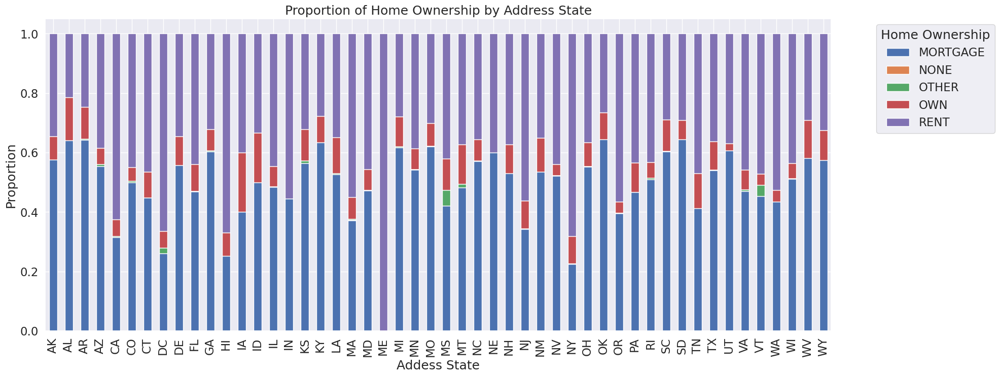

In [108]:
counts = df.groupby(['addr_state', 'home_ownership']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Home Ownership by Address State')
plt.ylabel('Proportion')
plt.xlabel('Addess State')
plt.legend(title='Home Ownership', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<ipython-input-109-801a0bda5f24>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


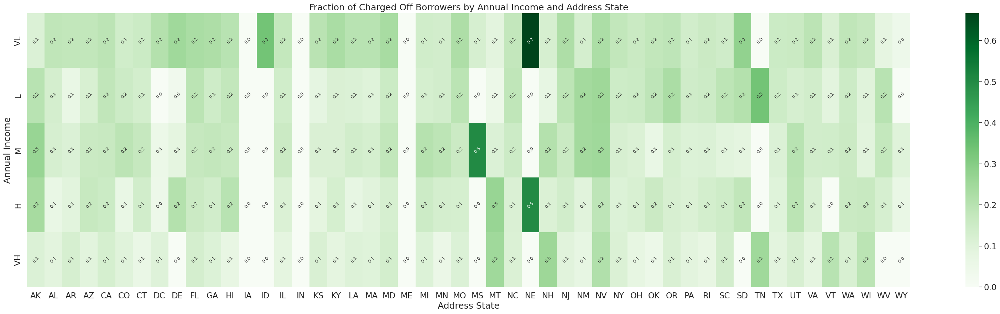

In [109]:
pivot_table = df.pivot_table(
    index='annual_inc_category',
    columns='addr_state',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 9})
plt.title('Fraction of Charged Off Borrowers by Annual Income and Address State')
plt.ylabel('Annual Income')
plt.xlabel('Address State')
plt.show()

<ipython-input-110-d7747d4cbd9e>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['addr_state', 'annual_inc_category']).size().unstack(fill_value=0)


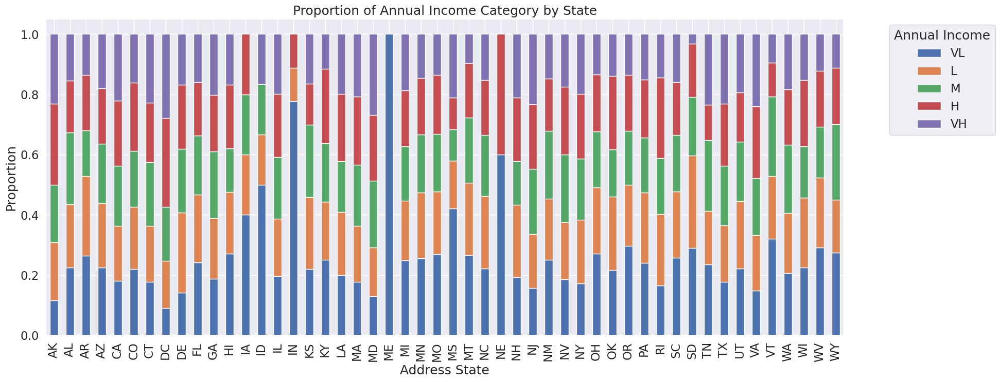

In [110]:
counts = df.groupby(['addr_state', 'annual_inc_category']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Annual Income Category by State')
plt.ylabel('Proportion')
plt.xlabel('Address State')
plt.legend(title='Annual Income', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

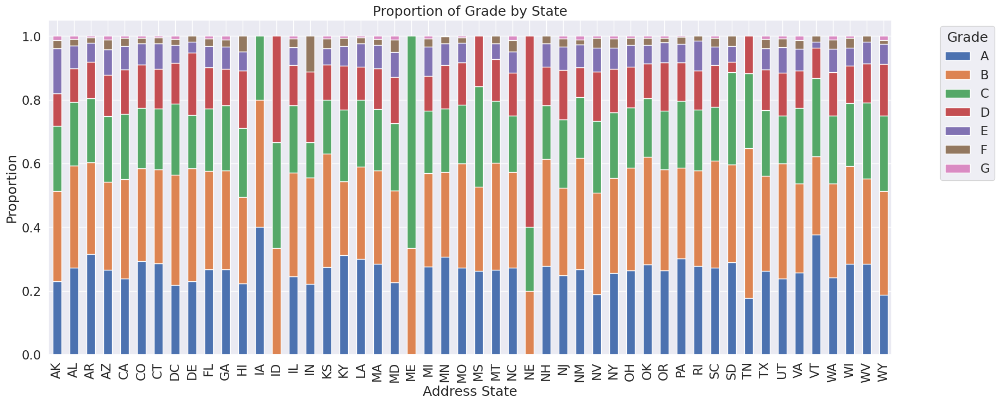

In [111]:
counts = df.groupby(['addr_state', 'grade']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Grade by State')
plt.ylabel('Proportion')
plt.xlabel('Address State')
plt.legend(title='Grade', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

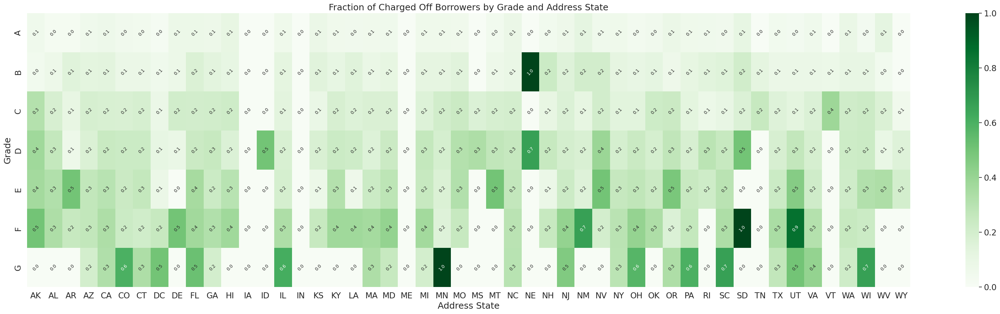

In [112]:
pivot_table = df.pivot_table(
    index='grade',
    columns='addr_state',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 9})
plt.title('Fraction of Charged Off Borrowers by Grade and Address State')
plt.ylabel('Grade')
plt.xlabel('Address State')
plt.show()

<ipython-input-113-fd2533802253>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


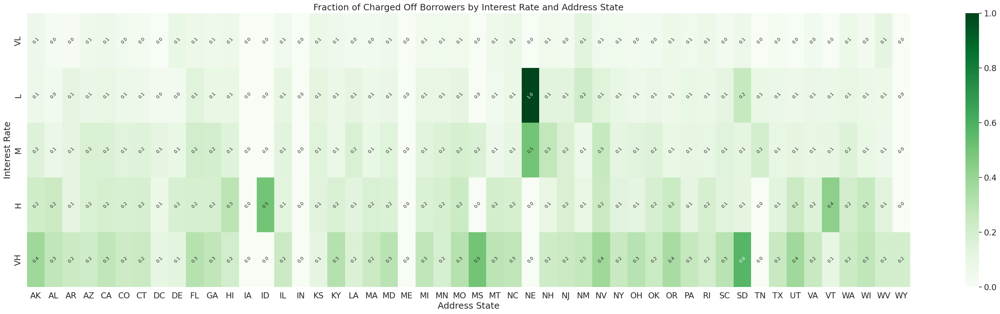

In [113]:
pivot_table = df.pivot_table(
    index='int_rate_category',
    columns='addr_state',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 9})
plt.title('Fraction of Charged Off Borrowers by Interest Rate and Address State')
plt.ylabel('Interest Rate')
plt.xlabel('Address State')
plt.show()

<ipython-input-114-b9b2d93dc9cd>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['addr_state', 'loan_amnt_category']).size().unstack(fill_value=0)


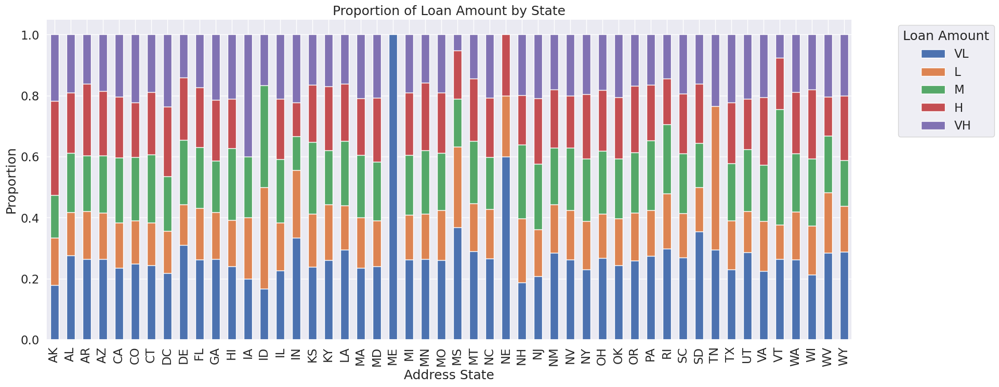

In [114]:
counts = df.groupby(['addr_state', 'loan_amnt_category']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Loan Amount by State')
plt.ylabel('Proportion')
plt.xlabel('Address State')
plt.legend(title='Loan Amount', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<ipython-input-115-022a55d3c48c>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


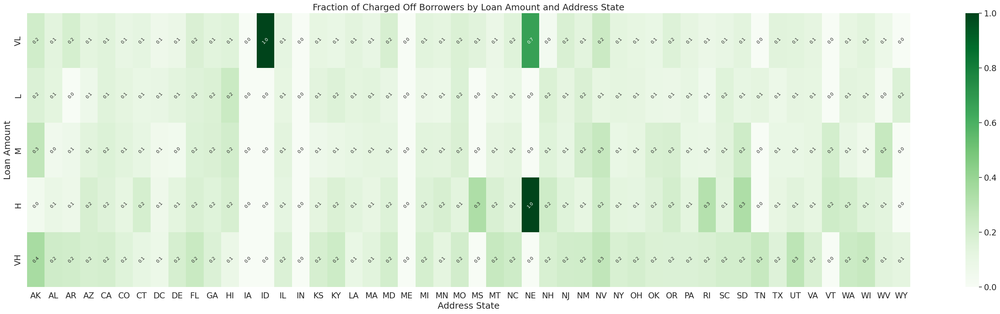

In [115]:
pivot_table = df.pivot_table(
    index='loan_amnt_category',
    columns='addr_state',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 9})
plt.title('Fraction of Charged Off Borrowers by Loan Amount and Address State')
plt.ylabel('Loan Amount')
plt.xlabel('Address State')
plt.show()

<ipython-input-116-bc18a46f4f31>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['addr_state', 'int_rate_category']).size().unstack(fill_value=0)


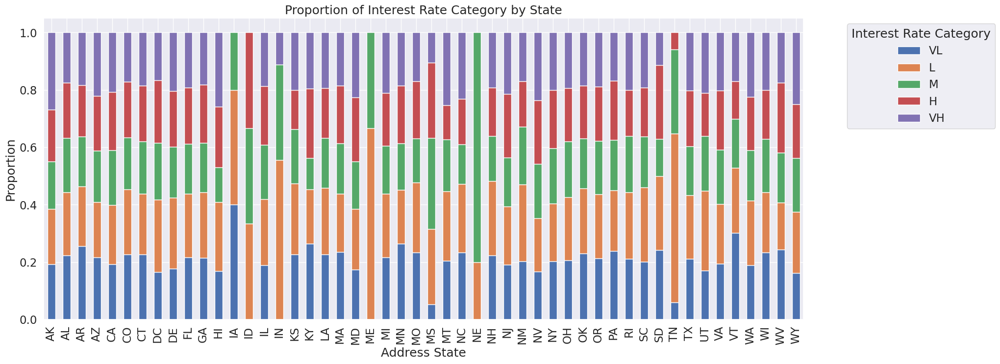

In [116]:
counts = df.groupby(['addr_state', 'int_rate_category']).size().unstack(fill_value=0)
# Calculate the proportion of each category
proportions = counts.div(counts.sum(axis=1), axis=0)

# Plotting
proportions.plot(kind='bar', stacked=True, figsize=(20, 8))
plt.title('Proportion of Interest Rate Category by State')
plt.ylabel('Proportion')
plt.xlabel('Address State')
plt.legend(title='Interest Rate Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

A (lowest) graded loans, lowest interest rates should be recommended for state NE.

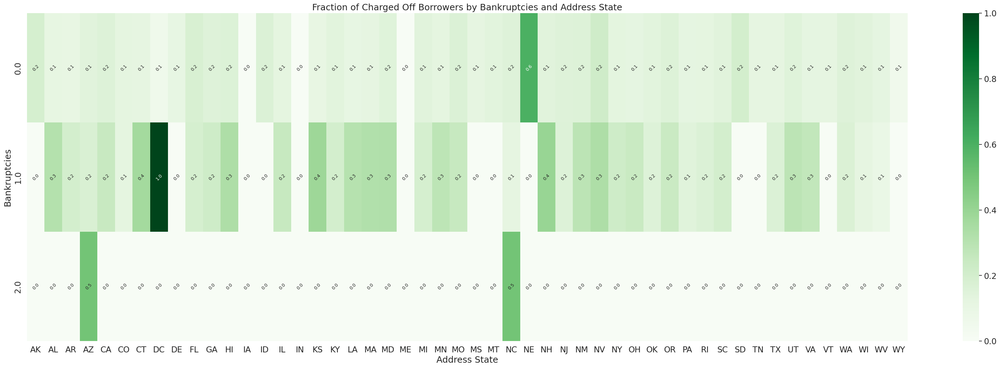

In [117]:
pivot_table = df.pivot_table(
    index='pub_rec_bankruptcies',
    columns='addr_state',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,12))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 9})
plt.title('Fraction of Charged Off Borrowers by Bankruptcies and Address State')
plt.ylabel('Bankruptcies')
plt.xlabel('Address State')
plt.show()

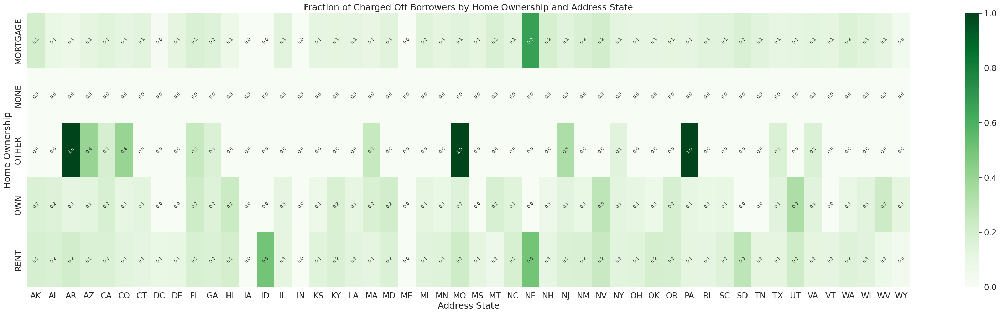

In [118]:
pivot_table = df.pivot_table(
    index='home_ownership',
    columns='addr_state',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 9})
plt.title('Fraction of Charged Off Borrowers by Home Ownership and Address State')
plt.ylabel('Home Ownership')
plt.xlabel('Address State')
plt.show()

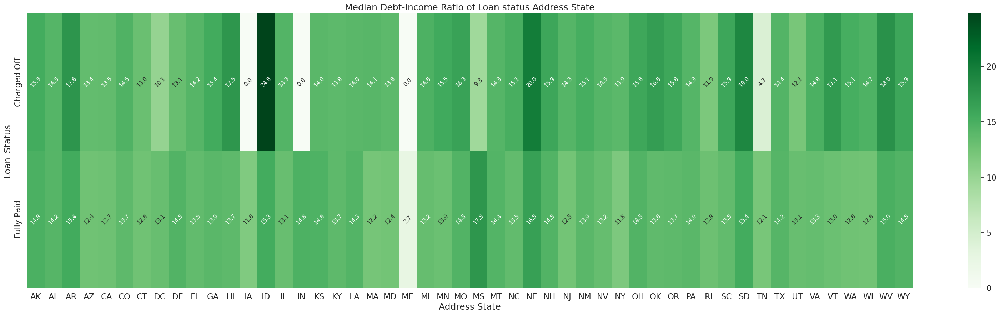

In [119]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='addr_state',
    values='dti',
    aggfunc='median'  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 11})
plt.title('Median Debt-Income Ratio of Loan status Address State')
plt.ylabel('Loan_Status')
plt.xlabel('Address State')
plt.show()

As per bivariate analysis with loan_status, the charged off borrowers have higher dti. Charged off borrowers with Higher dti roughly above 19% seen in NE, ID.

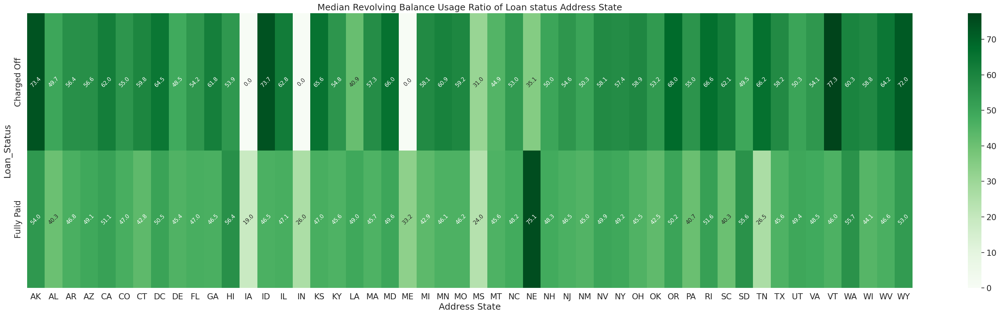

In [120]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='addr_state',
    values='revol_util',
    aggfunc='median'  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(40,10))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f',annot_kws={"rotation": 45,"size": 11})
plt.title('Median Revolving Balance Usage Ratio of Loan status Address State')
plt.ylabel('Loan_Status')
plt.xlabel('Address State')
plt.show()

Let us check home_ownership with respect to different variables.

Very high interest rate always lead to defaults and it is most intense for people with 'Other' home ownership.

<ipython-input-121-d7673d21422f>:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


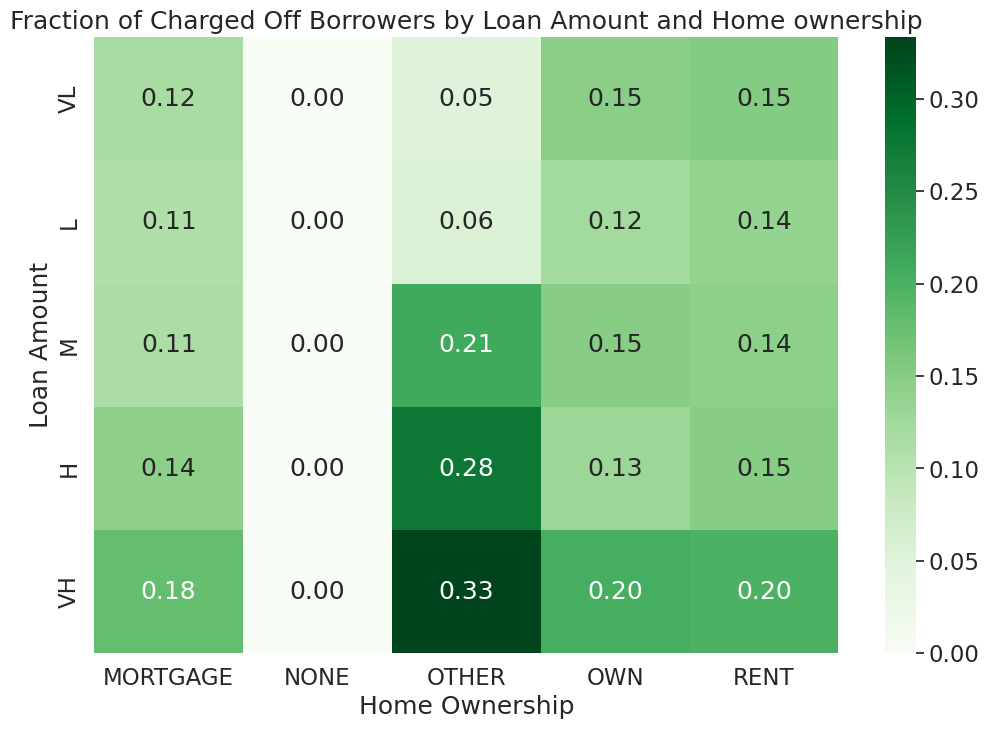

In [121]:
pivot_table = df.pivot_table(
    index='loan_amnt_category',
    columns='home_ownership',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Loan Amount and Home ownership')
plt.ylabel('Loan Amount')
plt.xlabel('Home Ownership')
plt.show()

For 'Other' category of home ownership, loan amounts should be restricted to range of L (5000 to 7750) and VL (500 to 5000) for preventing defaults.

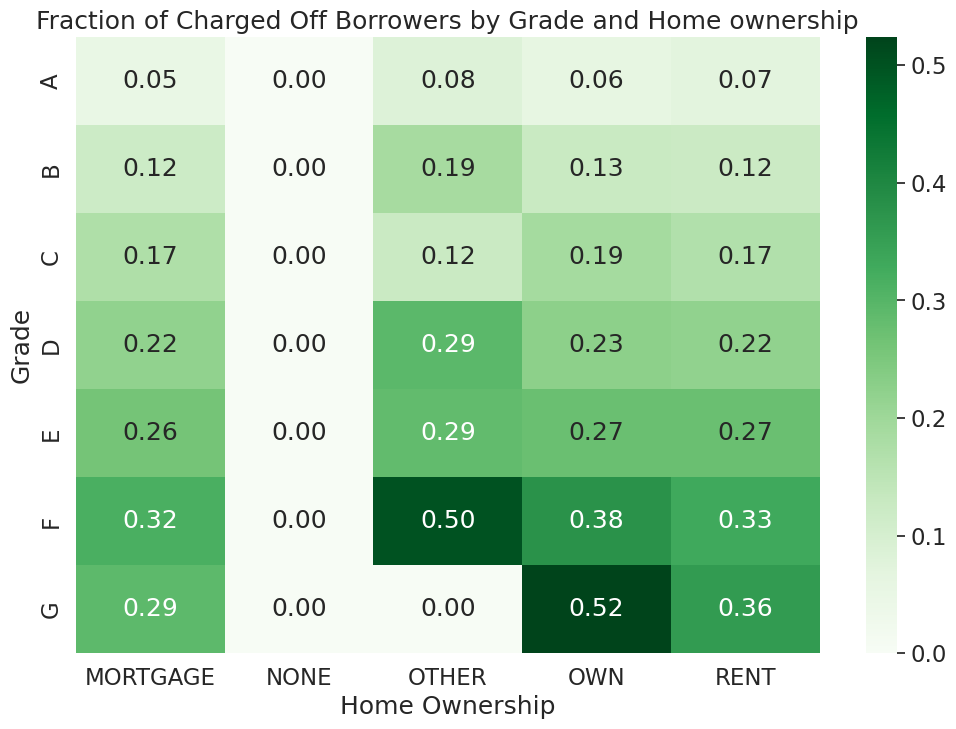

In [122]:
pivot_table = df.pivot_table(
    index='grade',
    columns='home_ownership',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Grade and Home ownership')
plt.ylabel('Grade')
plt.xlabel('Home Ownership')
plt.show()

<ipython-input-123-31bcbd362ad3>:3: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = df.pivot_table(


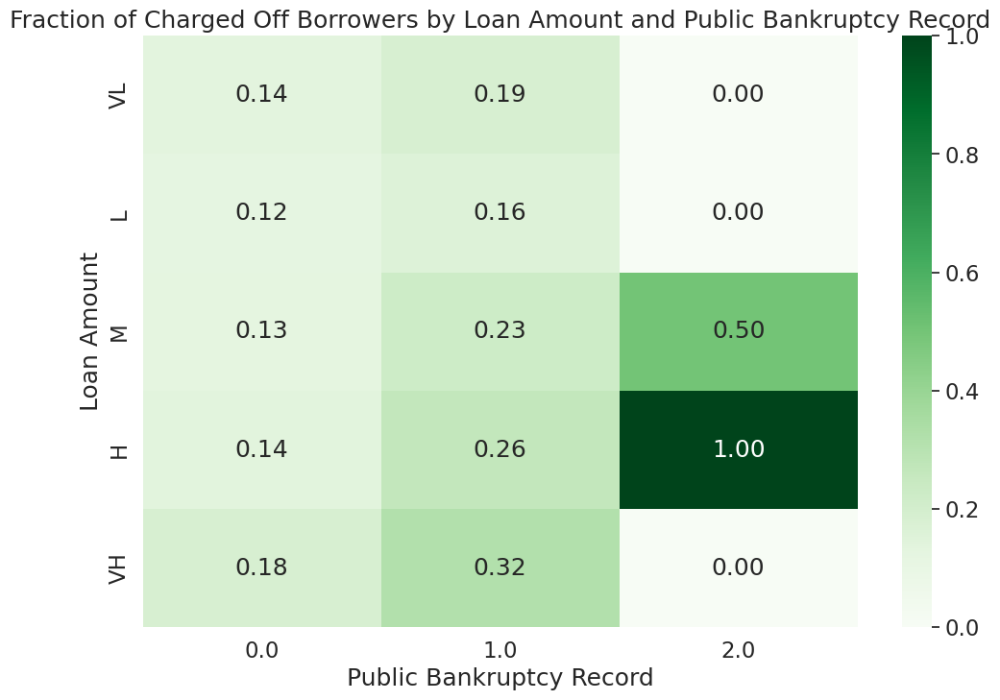

In [123]:
# Checking charged off proportion by loan amount categories and bankruptcies

pivot_table = df.pivot_table(
    index='loan_amnt_category',
    columns='pub_rec_bankruptcies',
    values='loan_status',
    aggfunc=lambda x: (x == 'Charged Off').sum() / len(x)  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Fraction of Charged Off Borrowers by Loan Amount and Public Bankruptcy Record')
plt.ylabel('Loan Amount')
plt.xlabel('Public Bankruptcy Record')
plt.show()

People with maximum bankrupt records took loans in High and Medium range and defaulted.

Let us check emp_length with different variables.

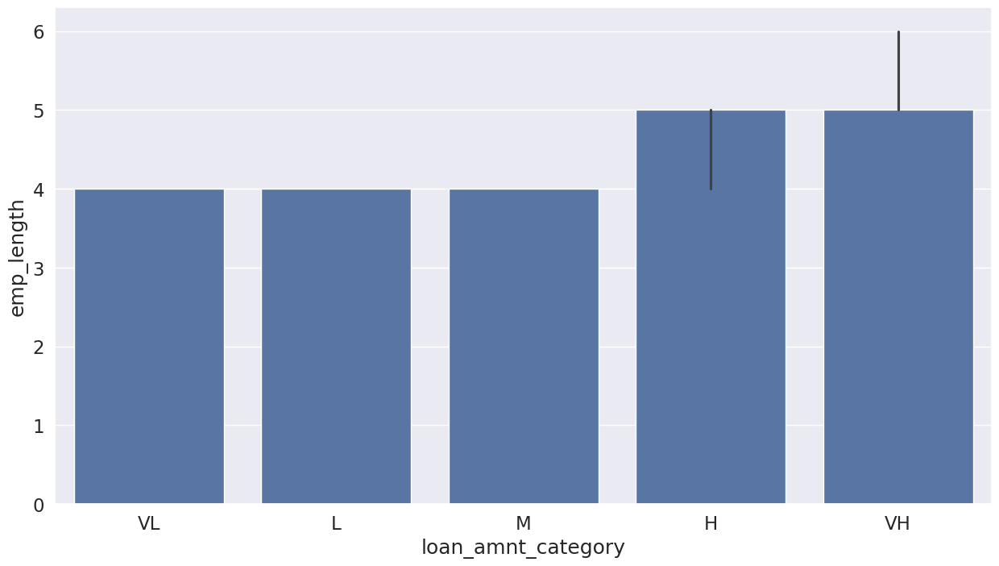

In [124]:
plt.figure(figsize=[15,8])
sns.barplot(x='loan_amnt_category', y='emp_length', data=df, estimator='median')
plt.show()

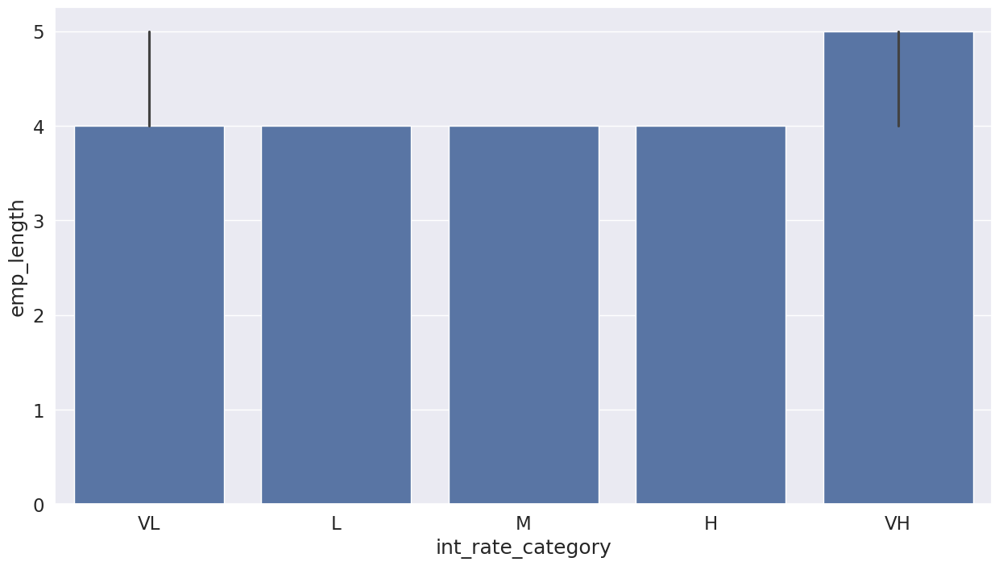

In [125]:
plt.figure(figsize=[15,8])
sns.barplot(x='int_rate_category', y='emp_length', data=df, estimator='median')
plt.show()

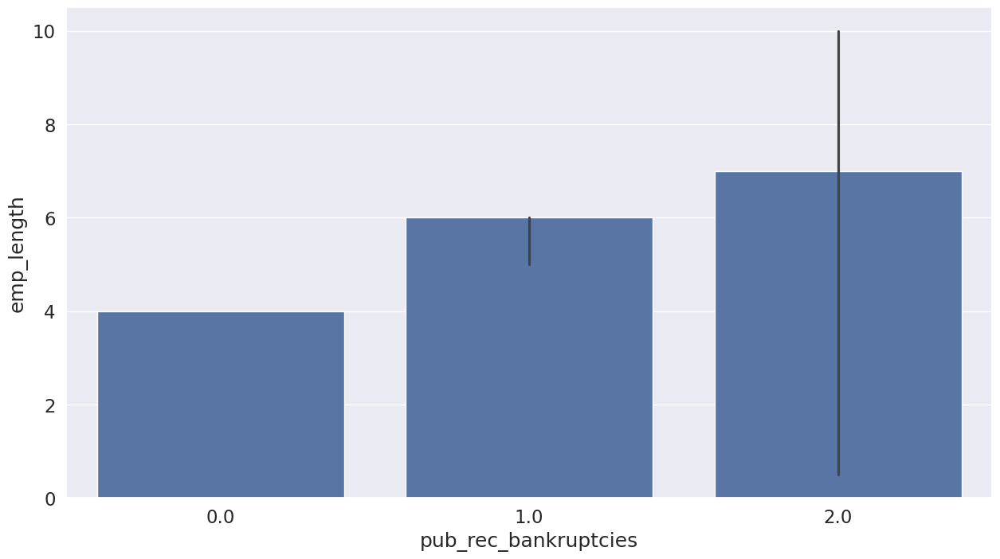

In [126]:
plt.figure(figsize=[15,8])
sns.barplot(x='pub_rec_bankruptcies', y='emp_length', data=df, estimator='median')
plt.show()

Higher employee length had more bankruptcies. But this cannot be said with much confidence, as very few people had bankruptcy cases.

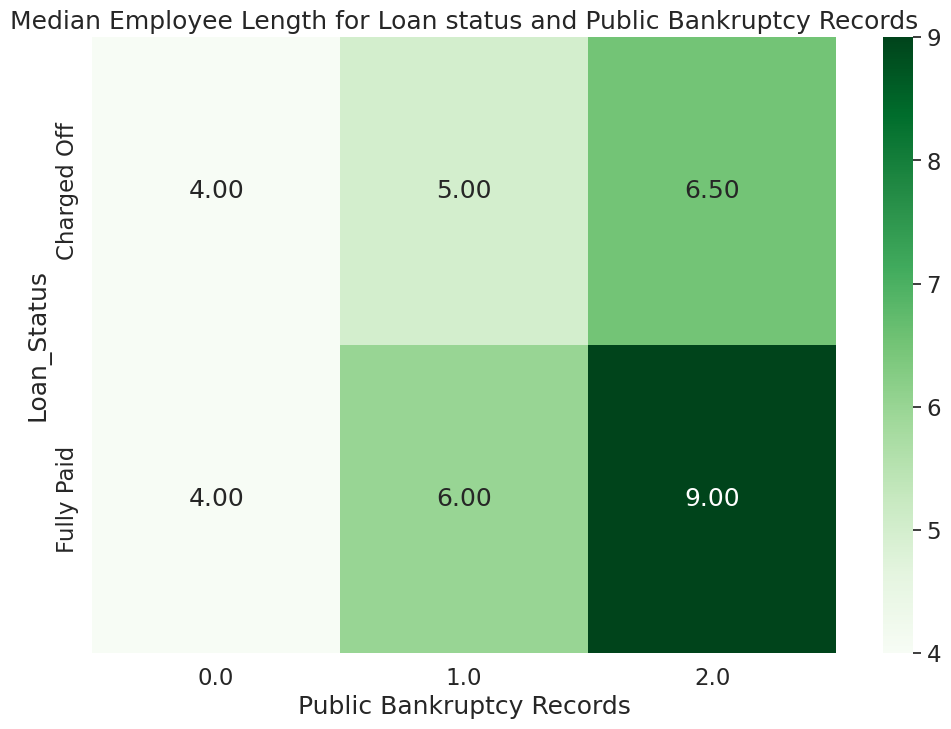

In [127]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='pub_rec_bankruptcies',
    values='emp_length',
    aggfunc='median'  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(12,8))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Median Employee Length for Loan status and Public Bankruptcy Records')
plt.ylabel('Loan_Status')
plt.xlabel('Public Bankruptcy Records')
plt.show()

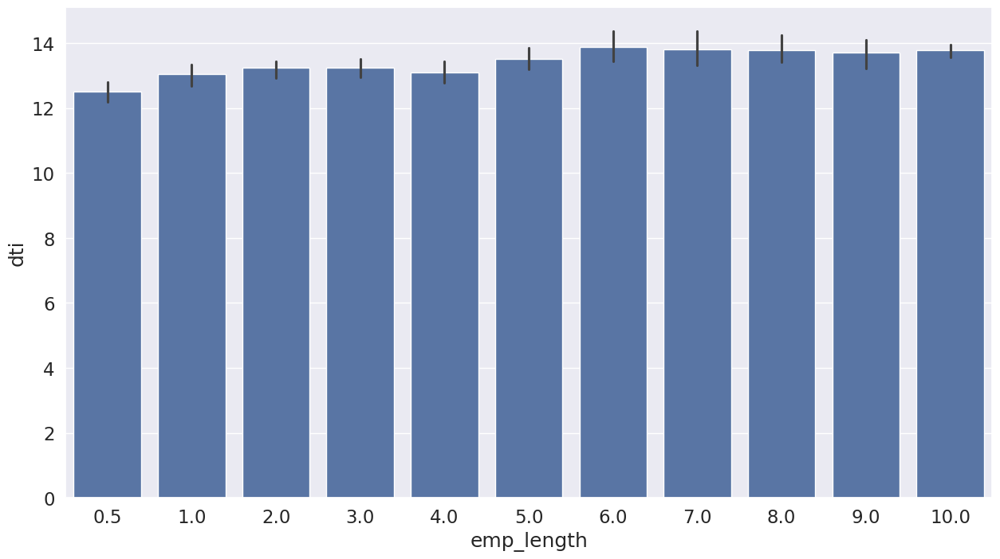

In [128]:
plt.figure(figsize=[15,8])
sns.barplot(x='emp_length', y='dti', data=df, estimator='median')
plt.show()

DTI is very slightly increasing with employee length.

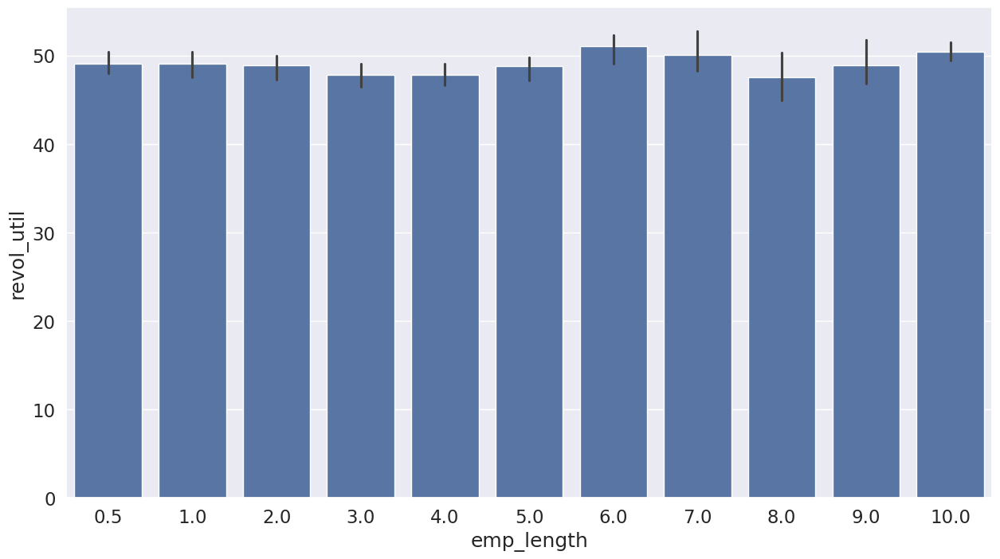

In [129]:
plt.figure(figsize=[15,8])
sns.barplot(x='emp_length', y='revol_util', data=df, estimator='median')
plt.show()

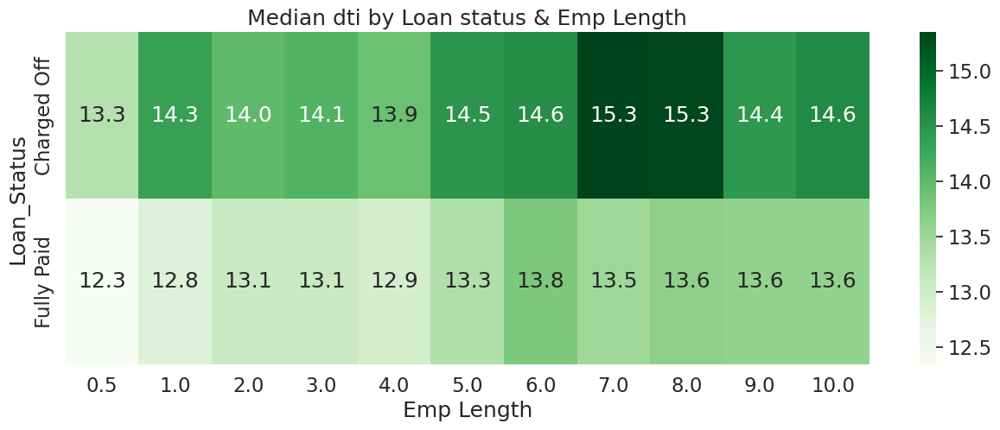

In [130]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='emp_length',
    values='dti',
    aggfunc='median'  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(15,5))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f')
plt.title('Median dti by Loan status & Emp Length')
plt.ylabel('Loan_Status')
plt.xlabel('Emp Length')
plt.show()

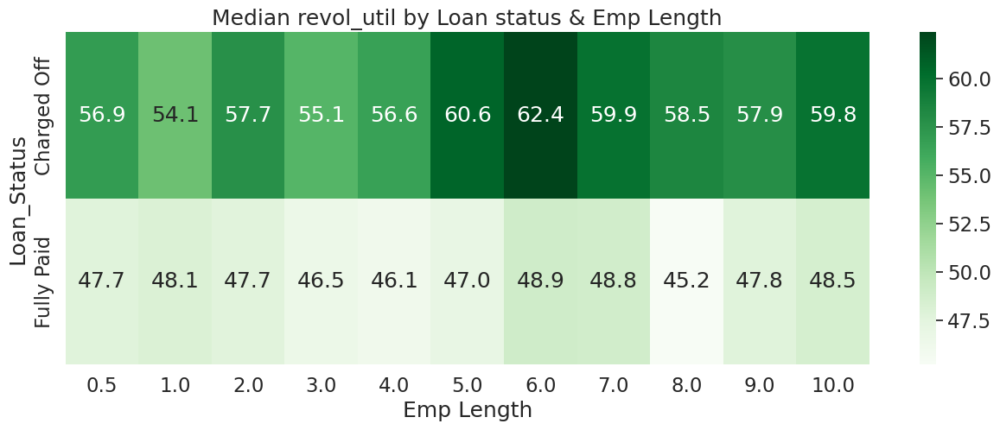

In [131]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='emp_length',
    values='revol_util',
    aggfunc='median'  # Calculate the fraction of charged off
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(15,5))
sns.set(font_scale=1.5)
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.1f')
plt.title('Median revol_util by Loan status & Emp Length')
plt.ylabel('Loan_Status')
plt.xlabel('Emp Length')
plt.show()

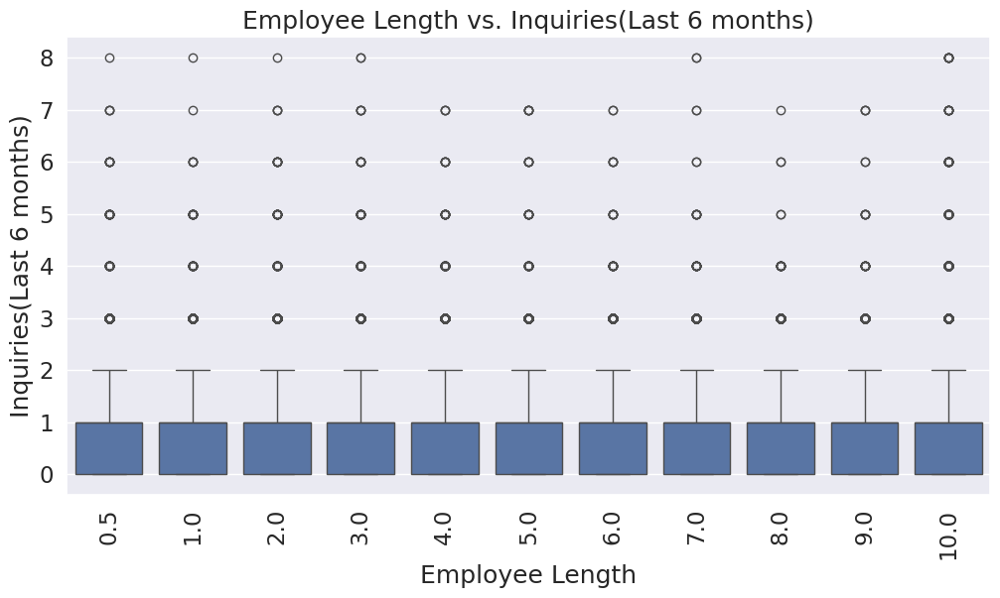

In [132]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='emp_length', y='inq_last_6mths')
plt.title('Employee Length vs. Inquiries(Last 6 months)')
plt.xlabel('Employee Length')
plt.ylabel('Inquiries(Last 6 months)')
plt.xticks(rotation=90)
plt.show()

Let us check number of inquires made against various categories.

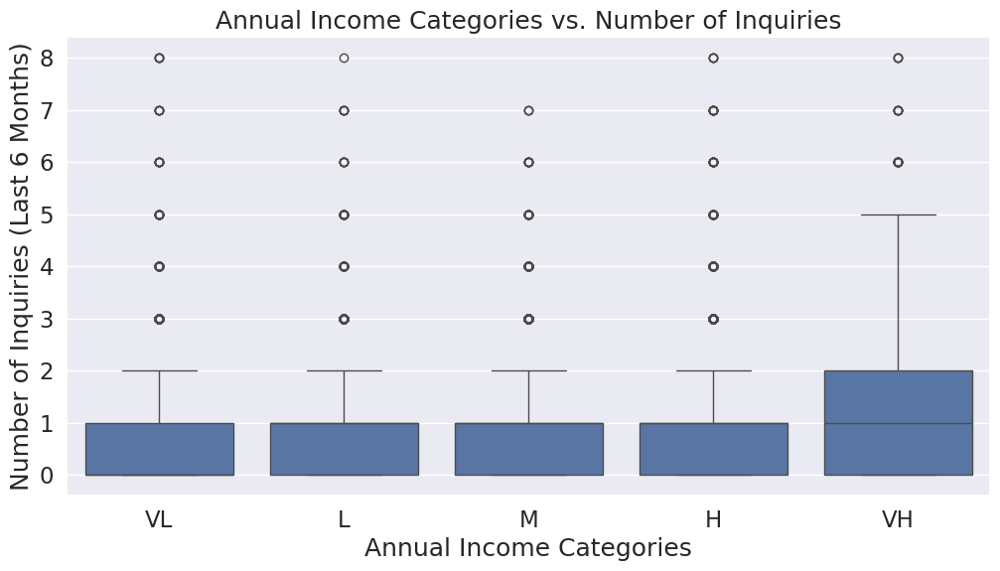

In [133]:
# Box plot for Income categories vs. Inquiries

plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='annual_inc_category', y='inq_last_6mths')
plt.title('Annual Income Categories vs. Number of Inquiries')
plt.xlabel('Annual Income Categories')
plt.ylabel('Number of Inquiries (Last 6 Months)')
plt.show()


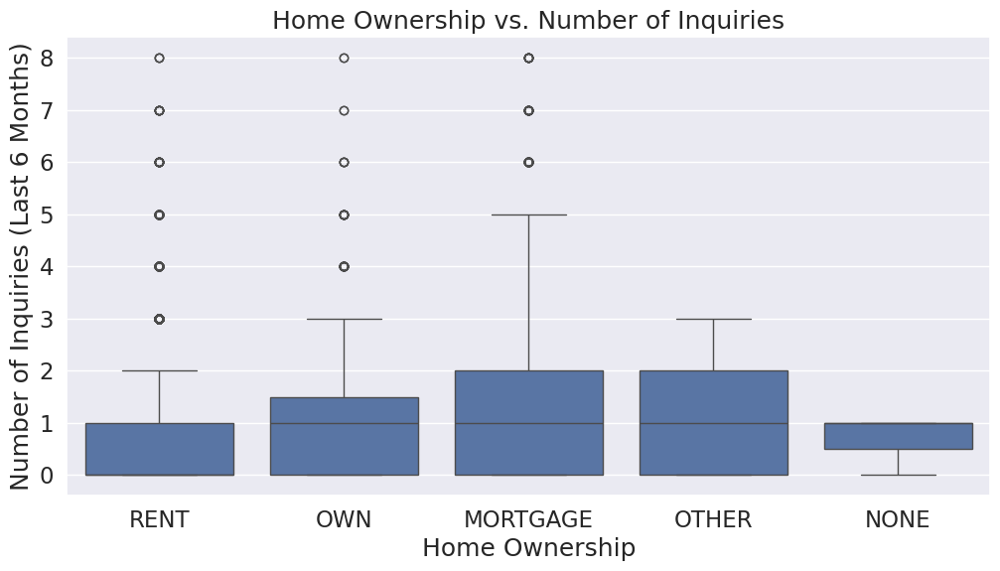

In [134]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='home_ownership', y='inq_last_6mths')
plt.title('Home Ownership vs. Number of Inquiries')
plt.xlabel('Home Ownership')
plt.ylabel('Number of Inquiries (Last 6 Months)')
plt.show()

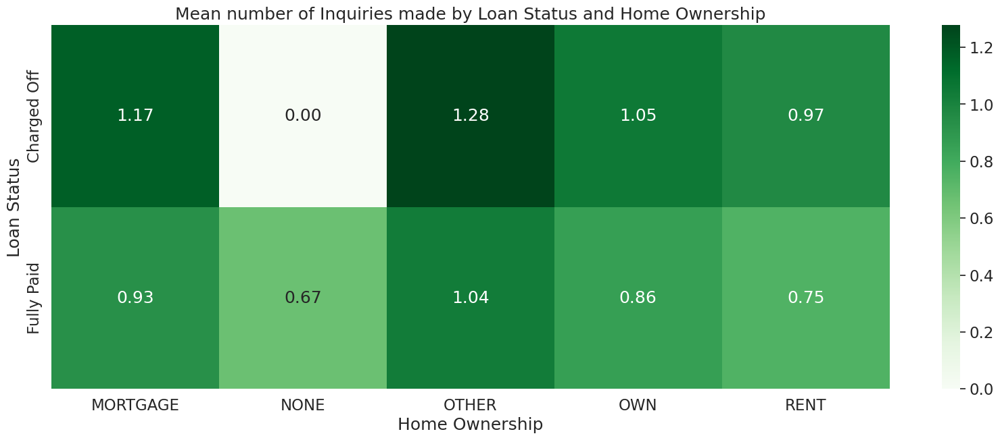

In [135]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='home_ownership',
    values='inq_last_6mths',
    aggfunc='mean'
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(20, 7))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Mean number of Inquiries made by Loan Status and Home Ownership')
plt.ylabel('Loan Status')
plt.xlabel('Home Ownership')
plt.show()

Multivariate Analysis with Credit score

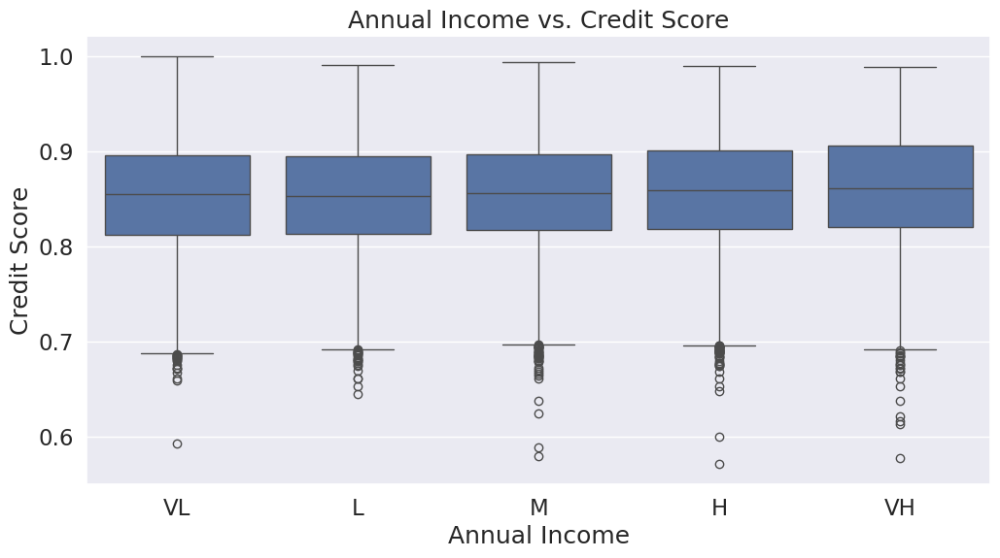

In [136]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='annual_inc_category', y='credit_score')
plt.title('Annual Income vs. Credit Score')
plt.xlabel('Annual Income')
plt.ylabel('Credit Score')
plt.show()

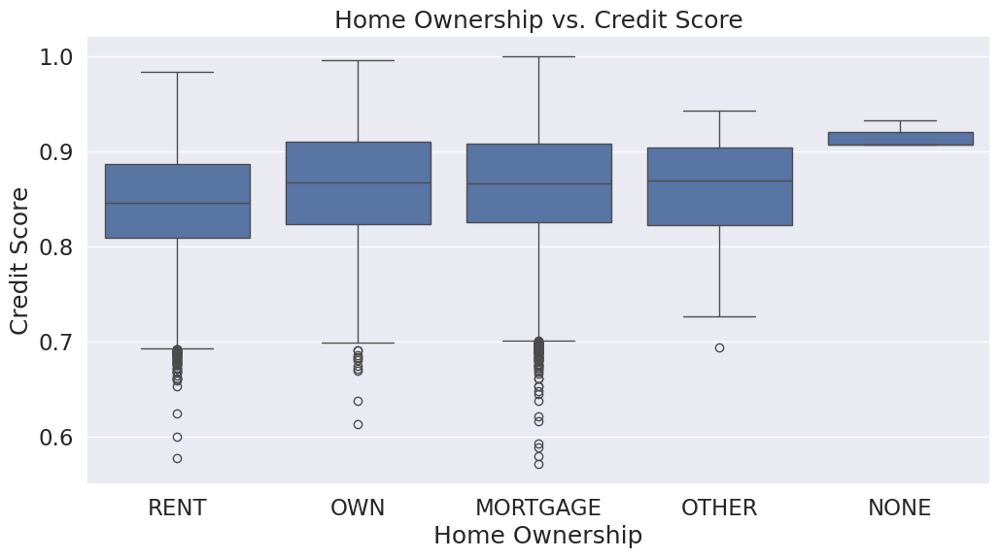

In [137]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='home_ownership', y='credit_score')
plt.title('Home Ownership vs. Credit Score')
plt.xlabel('Home Ownership')
plt.ylabel('Credit Score')
plt.show()

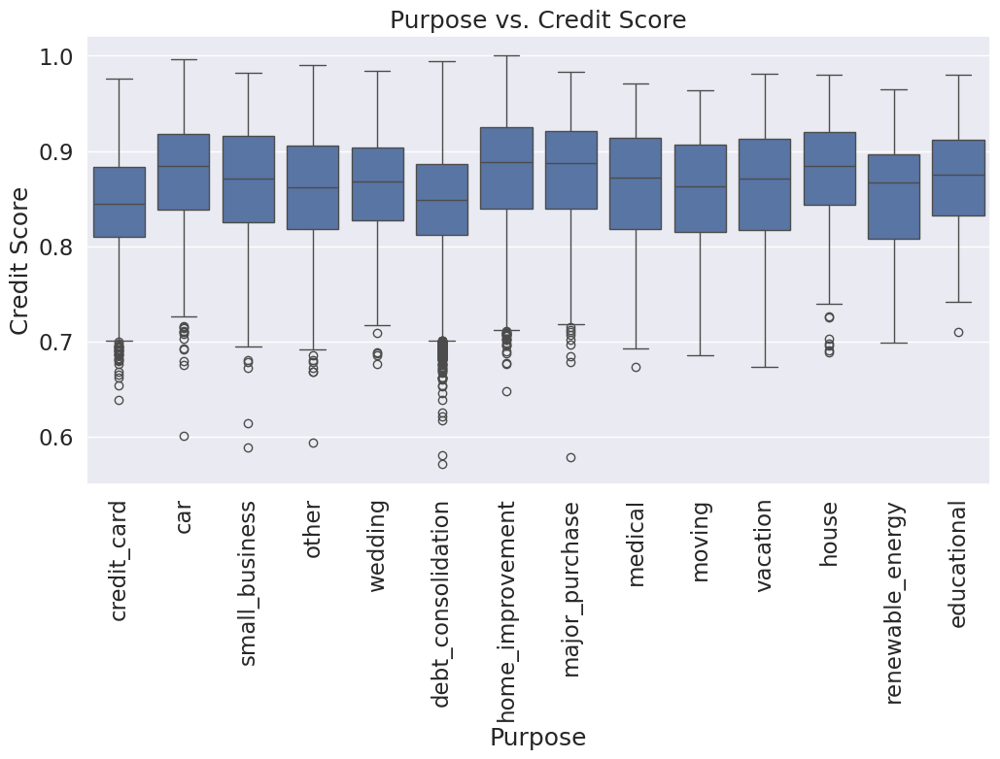

In [138]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='purpose', y='credit_score')
plt.title('Purpose vs. Credit Score')
plt.xlabel('Purpose')
plt.ylabel('Credit Score')
plt.xticks(rotation=90)
plt.show()

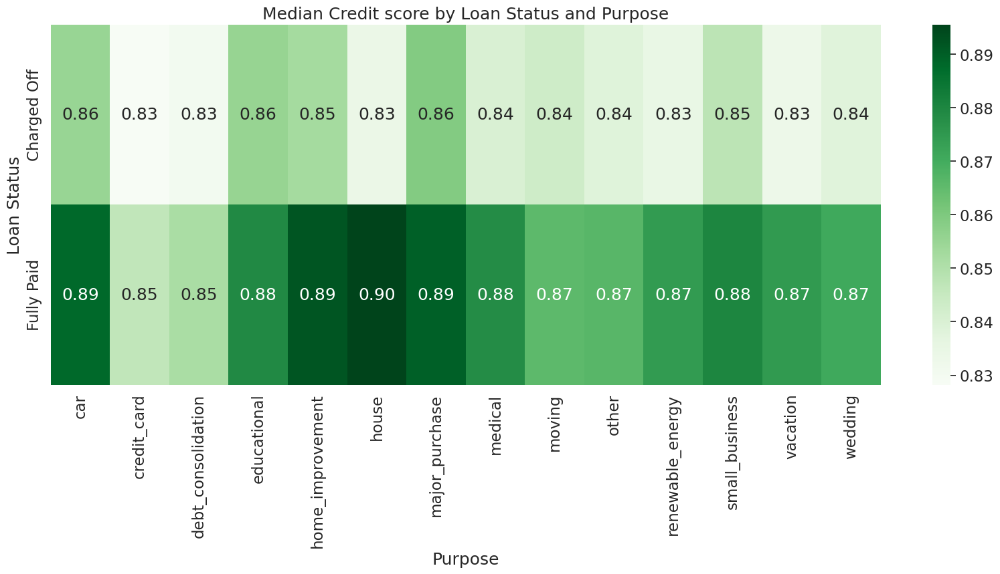

In [139]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='purpose',
    values='credit_score',
    aggfunc='median'
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(20, 7))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Median Credit score by Loan Status and Purpose')
plt.ylabel('Loan Status')
plt.xlabel('Purpose')
plt.show()

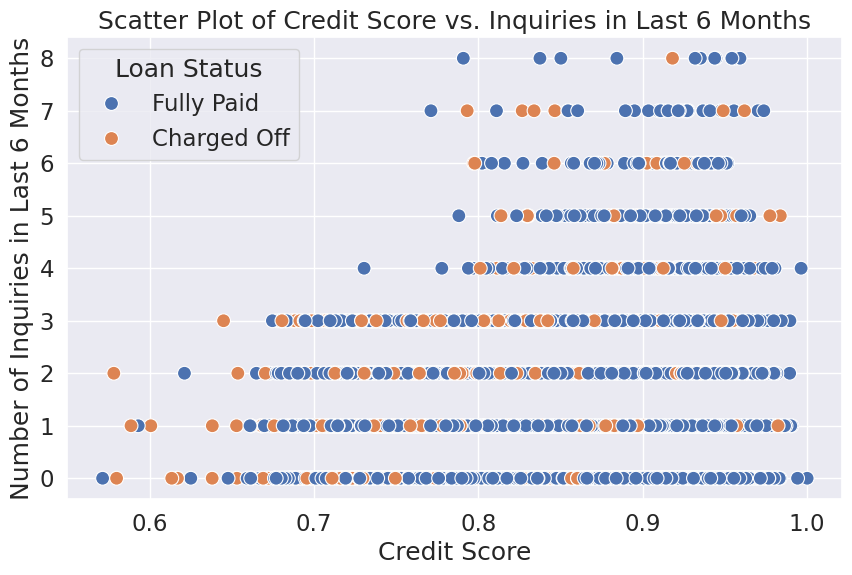

In [140]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='credit_score', y='inq_last_6mths', hue='loan_status', s=100)

# Add title and labels
plt.title('Scatter Plot of Credit Score vs. Inquiries in Last 6 Months')
plt.xlabel('Credit Score')
plt.ylabel('Number of Inquiries in Last 6 Months')

# Show legend
plt.legend(title='Loan Status')
plt.show()

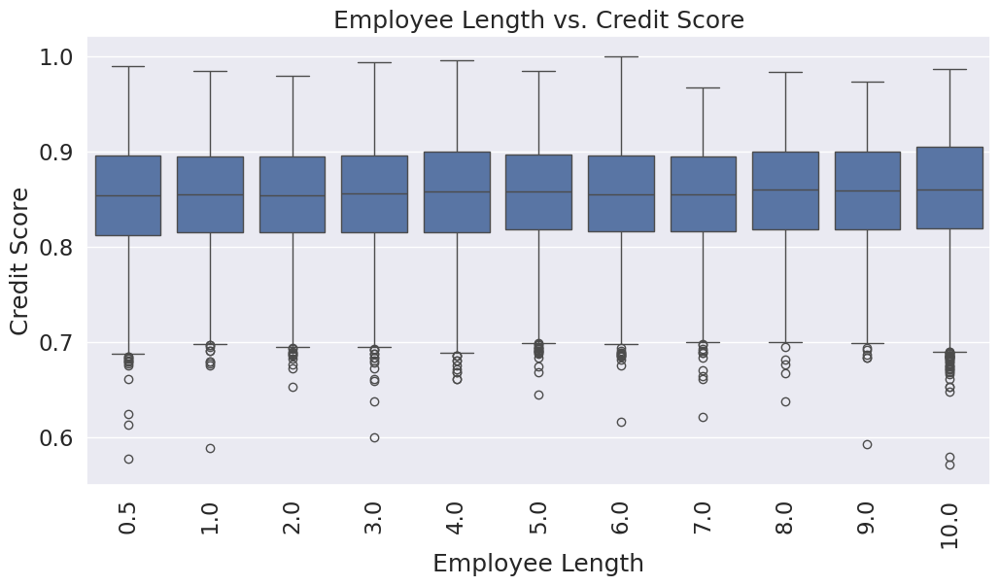

In [141]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='emp_length', y='credit_score')
plt.title('Employee Length vs. Credit Score')
plt.xlabel('Employee Length')
plt.ylabel('Credit Score')
plt.xticks(rotation=90)
plt.show()

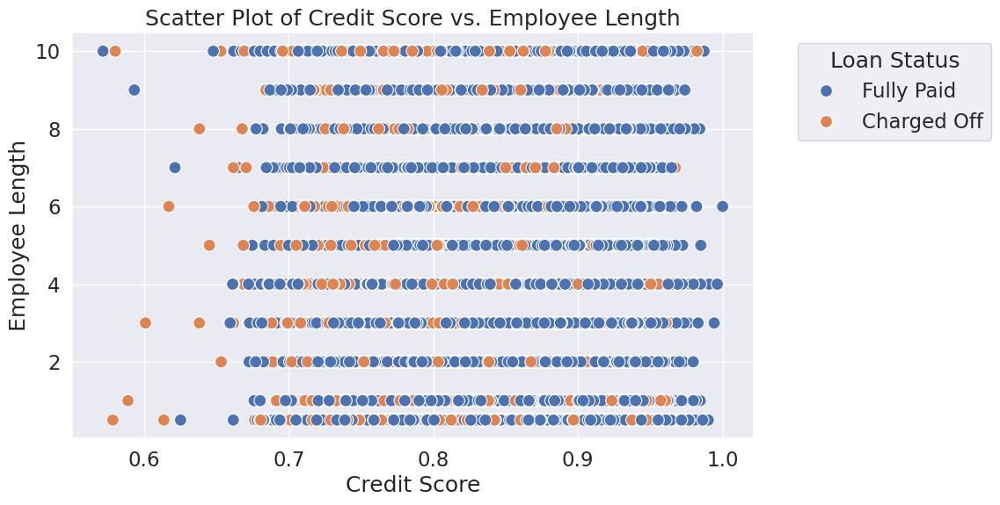

In [142]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='credit_score', y='emp_length', hue='loan_status', s=100)

# Add title and labels
plt.title('Scatter Plot of Credit Score vs. Employee Length')
plt.xlabel('Credit Score')
plt.ylabel('Employee Length')

# Show legend
plt.legend(title='Loan Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

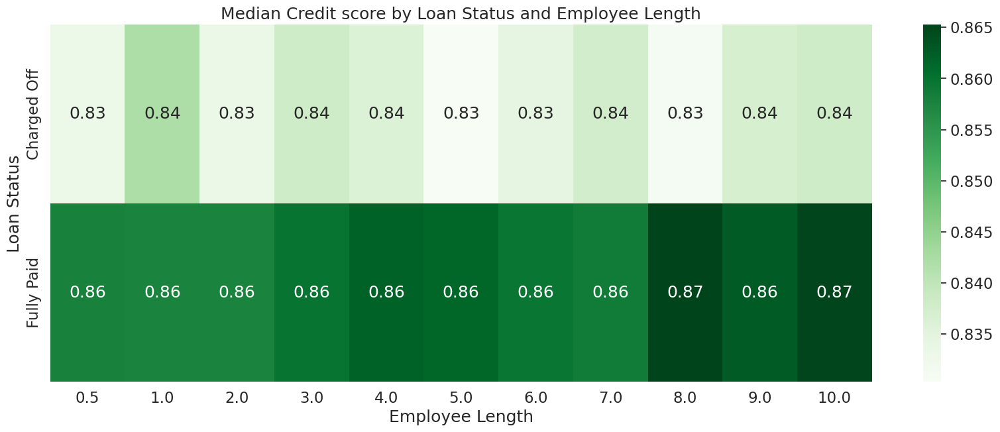

In [143]:
pivot_table = df.pivot_table(
    index='loan_status',
    columns='emp_length',
    values='credit_score',
    aggfunc='median'
)

# Fill NaN values with 0 for better visualization
pivot_table.fillna(0, inplace=True)

# Plotting the heatmap
plt.figure(figsize=(20, 7))
sns.heatmap(pivot_table, cmap='Greens', annot=True, fmt='.2f')
plt.title('Median Credit score by Loan Status and Employee Length')
plt.ylabel('Loan Status')
plt.xlabel('Employee Length')
plt.show()

# Conclusion

1. Higher charged off cases are observed for very high loan amounts. To reduce defaulter cases, the loan amounts are recommended to stay within 17K. Also, not all loans are funded by investors.

2. High interest rates on loans is also a driving factor leading to high charge off cases. To curb down defaulter cases, a reasonable interest rate roughly within 5.4% to 11% is recommended.

3. Charged Off applicants have slightly higher Debt to Income Ratio significantly higher Revolving Line Utilization indicating they rely too much on loans and consequently cannot pay the debts.Borrowers whose Debt Income Ratio cross 15 and Revolving Line Utilization cross 45 are risky and need to be treated with caution.

4. a) As loan grade increases, from A to G, the charge off rate also increases and the grades are influenced by interest rates. Applicants in small business are taking higher graded higher interest loans, making more inquiries in last 6 months requesting for more credits, struggling with credit repay than debt consolidation and consequently getting charged off more than other purpose categories (about 26%). Lower grade loans preferably grade A should be prioritised.

 b) While rejecting people taking loans for small business purpose as they had high charge off rates, it should be ensured that no opportunity is missed while rejecting a capable applicant with small business purpose from providing loan by taking care of the nuances. Criteria for applicants taking loans for small business purpose who should not be rejected from taking loans:

  - Credit score > 0.85
  - Revolving Line Utilization rate < 35
  - Annual Income group = VH (16000.00 to 35000.00)



5. Applicants with lower income charge off more.

6. Most applicants opt for short term (36 months) loans. Applicants with long term loans (60 months) were observed to have charged off more.

7. Charged Off borrowers have lower credit score than fully paid ones. Credit score below 0.8 should be treated with caution.

8. Among the states, NE shows highest percentage of charged off applicants. Among employee titles, Walmart employees have higher charge off rates.



9. Weak indicators:
Although weak indicators, following patterns are observed:

  a. Applicants with higher bankruptcy records have charged off more.

  b. Charged Off applicants have paid higher late fees than fully paid ones.

  c.  Among Home_ownership, 'Other' category comprise the lowest proportion among the applicants but have the highest charge off rate.

